In [1]:
%matplotlib inline

from boututils.datafile import DataFile
from boutdata.collect import collect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import platform
import traceback
import xarray
import xbout
import scipy
import re

onedrive_path = onedrive_path = str(os.getcwd()).split("OneDrive")[0] + "OneDrive"
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\sdtools"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\soledge"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages"))

from hermes3.utils import *

import gridtools.solps_python_scripts.setup
from gridtools.solps_python_scripts.utilities.last10s       import read_last10s

from hermes3.fluxes import *
from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *

from code_comparison.code_comparison import *
from code_comparison.viewer_2d import *


%load_ext autoreload
%autoreload 2

plt.close("all")
%matplotlib inline

print("Done")


st40_phys_viewer can not be loaded from outside Tokamak Energy!

Done


In [5]:
   
db = CaseDB()
toload = [
    dict(name="best_notune", id = "d24bdb-cond0.25_frec0.68"),
    dict(name="afnE_mfp1", id = "d24b-tunefrec_E_AFN_mfp1.0"),
    dict(name="afnE_mfp1_cond0.75", id = "d24ba-E_mfp1_cond0.75"),
    dict(name="afnE_mfp1_cond0.5", id = "d24bb-E_mfp1_cond0.5"),
    dict(name="afnE_mfp1_cond0.25", id = "d24bc-E_mfp1_cond0.25"),
    dict(name="afnE_mfp1_cond0.01_minmod_diagnosePd", id = "d27ba-cond0.01_frec0.68_MinMod_diagPd"),
    dict(name="afnE_mfp1_cond0.1", id = "d24be-cond0.10_frec0.68"),
    dict(name="afnE_mfp1_cond0.01", id = "d24bf-cond0.01_frec0.68"),
    dict(name="afnE_mfp1_cond0.01_minmod", id = "d27b-cond0.01_frec0.68_MinMod"),
    dict(name="afnE_minmod_no_perp_compr", id = "d24bfd-minmod_no_perp_compr")
]
casestore = {}
for case in toload:
    casestore[case["name"]] = db.load_case_2D(case["id"], use_squash = True, verbose = True)

- Reading case d24bdb-cond0.25_frec0.68
-----------------------
- Looking for squash file
- Squash file found. squash date 10/16/2023, 10:26:58, dmp file date 10/16/2023, 10:02:49

- Reading case d24b-tunefrec_E_AFN_mfp1.0
-----------------------
- Looking for squash file
- Squash file found. squash date 10/15/2023, 22:03:01, dmp file date 10/13/2023, 18:12:51

- Reading case d24ba-E_mfp1_cond0.75
-----------------------
- Looking for squash file
- Squash file found. squash date 10/13/2023, 12:40:36, dmp file date 10/13/2023, 08:53:18

- Reading case d24bb-E_mfp1_cond0.5
-----------------------
- Looking for squash file
- Squash file found. squash date 10/14/2023, 14:39:31, dmp file date 10/13/2023, 18:29:40

- Reading case d24bc-E_mfp1_cond0.25
-----------------------
- Looking for squash file
- Squash file found. squash date 10/16/2023, 00:04:36, dmp file date 10/15/2023, 10:58:49

- Reading case d27ba-cond0.01_frec0.68_MinMod_diagPd
-----------------------
- Looking for squash file


In [6]:
hr = dict()
for name in casestore.keys(): 
    print(name)
    hr[name] = Hermesdata()
    hr[name].read_case(casestore[name].ds.isel(t=-1, x = slice(2,-2)))
    
    if "afnE" in  name:
        new_afn = True
        print(f"Loading {name} with new AFN")
    else:
        new_afn = False
        print(f"Loading {name} with old AFN")
    
    ds = casestore[name].ds
    ds = calculate_radial_fluxes(ds, new_afn = True)
    # ds = calculate_target_fluxes(ds)
    ds = reverse_pfr_fluxes(ds)

best_notune
Loading best_notune with old AFN
afnE_mfp1
Loading afnE_mfp1 with new AFN
afnE_mfp1_cond0.75
Loading afnE_mfp1_cond0.75 with new AFN
afnE_mfp1_cond0.5
Loading afnE_mfp1_cond0.5 with new AFN
afnE_mfp1_cond0.25
Loading afnE_mfp1_cond0.25 with new AFN
afnE_mfp1_cond0.01_minmod_diagnosePd
Loading afnE_mfp1_cond0.01_minmod_diagnosePd with new AFN
afnE_mfp1_cond0.1
Loading afnE_mfp1_cond0.1 with new AFN
afnE_mfp1_cond0.01
Loading afnE_mfp1_cond0.01 with new AFN
afnE_mfp1_cond0.01_minmod
Loading afnE_mfp1_cond0.01_minmod with new AFN
afnE_minmod_no_perp_compr
Loading afnE_minmod_no_perp_compr with new AFN


In [7]:
soledgecases = {
    "tightwall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_1e19"), # Hermes-3 like wall
    "tightwall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_2e19"), # Hermes-3 like wall
    "widewall_2e19_5m" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19_5M"),
    "tightwall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_3e19"), # Hermes-3 like wall
    "widewall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_1e19"), 
    "widewall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19"), 
    "widewall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_3e19"), 
}

sl = dict()

for name in soledgecases:
    path = soledgecases[name]
    sl[name] = SOLEDGEdata(path = path)
    sl[name].read_csv(os.path.join(path, "omp_plasma.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "omp_neutrals.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "imp_plasma.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "imp_neutrals.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "wall_ntmpi_plasma.csv"), mode = "wall_ntmpi")



c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astyp

# Overview

### I tuned fast recycling and went to MFP 0.1 with separate limiters and conduction limitation

# 2D plots

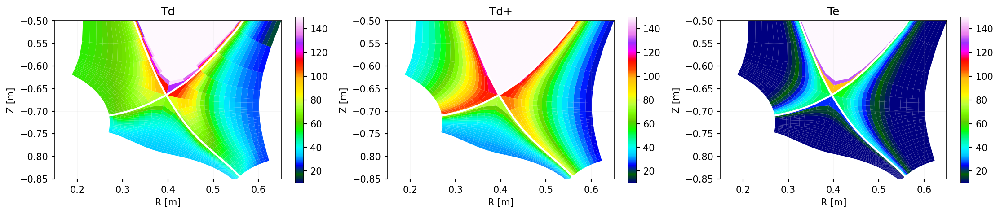

In [65]:
fig, axes = plt.subplots(1,3,figsize=(15,3), dpi = 150)
ds = casestore["best_notune"].ds.isel(t=-1)

vmin = 10
vmax = 150
common_settings = dict(cmap = "gist_ncar", antialias = True)
ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], vmin = vmin, vmax = vmax, **common_settings)
ds["Td+"].hermesm.clean_guards().bout.polygon(ax = axes[1], vmin = vmin, vmax = vmax, **common_settings)
ds["Te"].hermesm.clean_guards().bout.polygon(ax = axes[2], vmin = vmin, vmax = vmax, **common_settings)
# abs(ds["Fdd+_cx"]).bout.polygon(ax = axes[2], vmin = None, vmax = None, logscale = True, **common_settings)
for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    
fig.tight_layout()


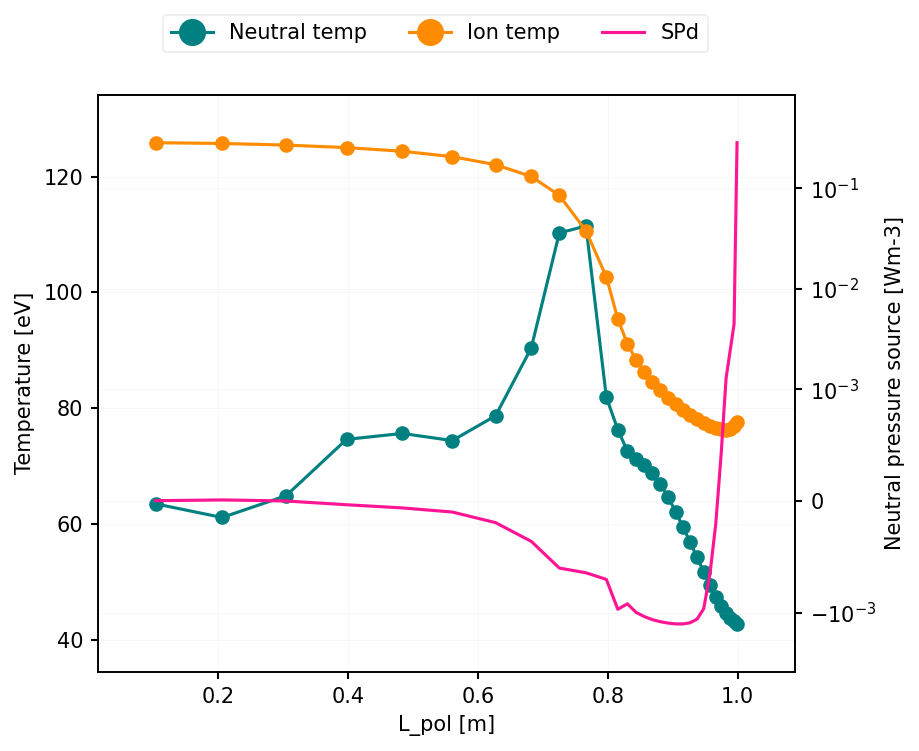

In [67]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, fl["Td"], marker = "o", label = "Neutral temp")
ax.plot(dist, fl["Td+"], marker = "o", label = "Ion temp")

ax2 = ax.twinx()
ax2.plot(dist, fl["SPd"], c = "deeppink", label = "SPd")
ax2.set_yscale("symlog", linthresh = 1e-3)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax2.set_ylabel("Neutral pressure source [Wm-3]")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

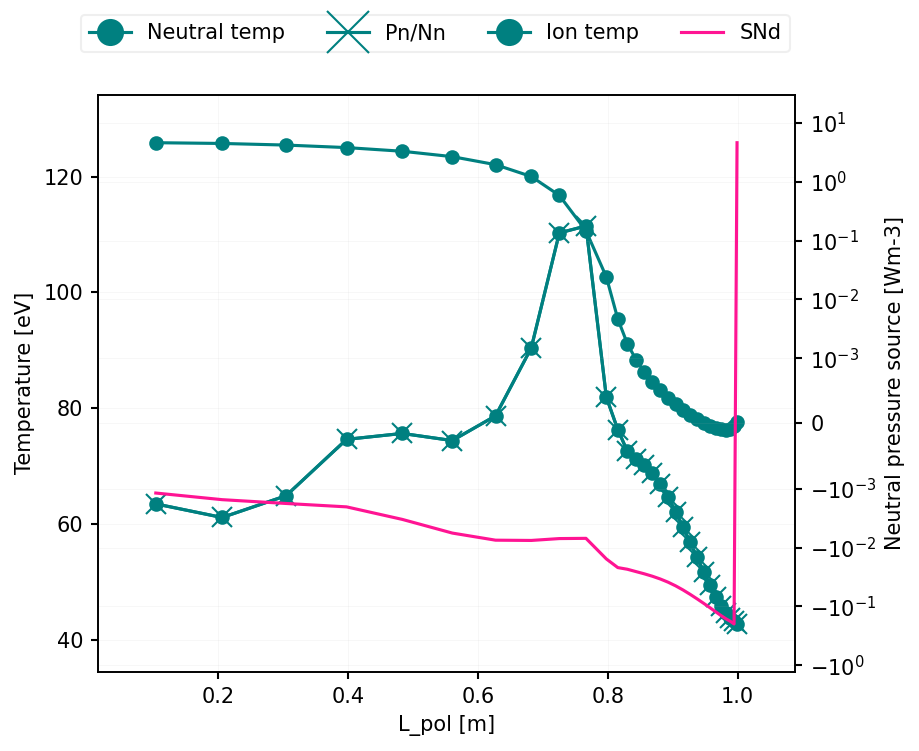

In [177]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, fl["Td"], marker = "o", label = "Neutral temp", color = "teal")
ax.plot(dist, fl["Pd"]/fl["Nd"]/constants("q_e"), marker = "x", label = "Pn/Nn", color = "teal", ms = 10)
ax.plot(dist, fl["Td+"], marker = "o", label = "Ion temp")

ax2 = ax.twinx()
ax2.plot(dist, fl["SNd"], c = "deeppink", label = "SNd")
ax2.set_yscale("symlog", linthresh = 1e-3)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax2.set_ylabel("Neutral pressure source [Wm-3]")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

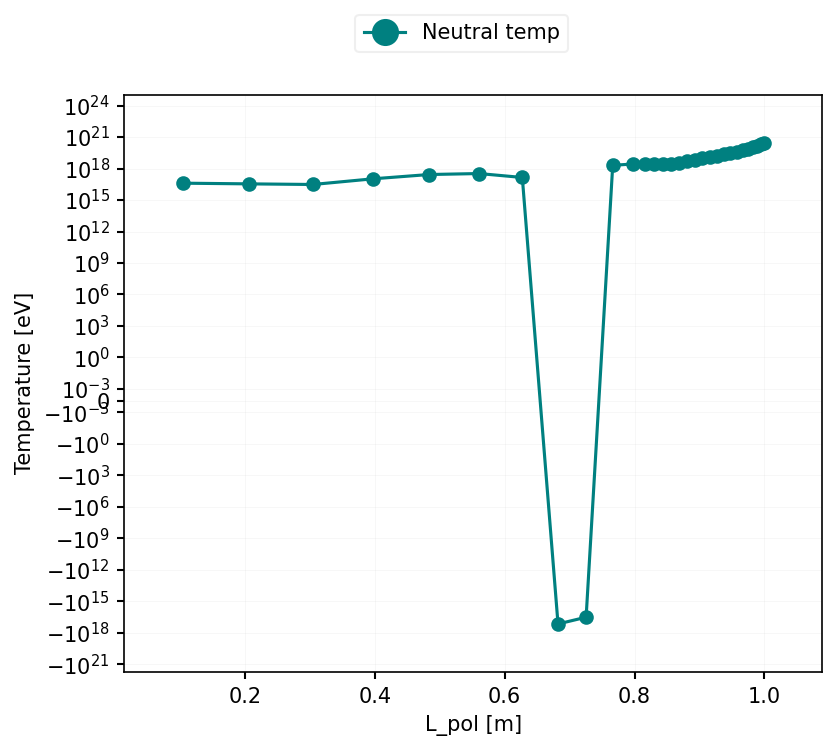

In [185]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, np.gradient(fl["Nd"], dist), marker = "o", label = "Neutral temp", color = "teal")
# ax.plot(dist, fl["Nd"], marker = "x", label = "Pn/Nn", color = "teal", ms = 10)
# ax.plot(dist, fl["Td+"], marker = "o", label = "Ion temp")
ax.set_yscale("symlog", linthresh = 1e-3)
# ax2 = ax.twinx()
# ax2.plot(dist, fl["SNd"], c = "deeppink", label = "SNd")
# ax2.set_yscale("symlog", linthresh = 1e-3)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax2.set_ylabel("Neutral pressure source [Wm-3]")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

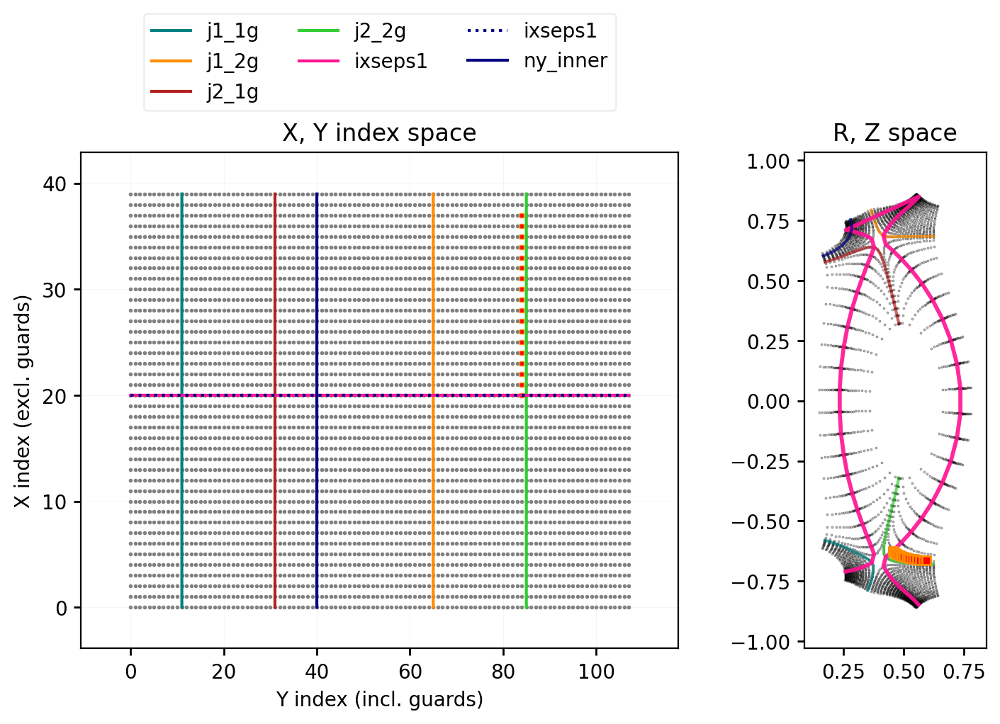

In [74]:
plot_selection(ds, ds.isel(theta = 84, x = slice(m["ixseps1"], -2)), dpi = 200)

In [83]:
colors(range(len(indices)))

array([[0.050383, 0.029803, 0.527975, 1.      ],
       [0.274191, 0.012109, 0.622722, 1.      ],
       [0.447714, 0.00208 , 0.66024 , 1.      ],
       [0.610667, 0.090204, 0.619951, 1.      ],
       [0.740143, 0.213864, 0.524216, 1.      ],
       [0.846788, 0.342551, 0.420579, 1.      ],
       [0.928329, 0.472975, 0.326067, 1.      ],
       [0.983041, 0.624131, 0.227937, 1.      ],
       [0.991209, 0.790537, 0.149377, 1.      ],
       [0.940015, 0.975158, 0.131326, 1.      ]])

## Multiple radial slices

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1839852465.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

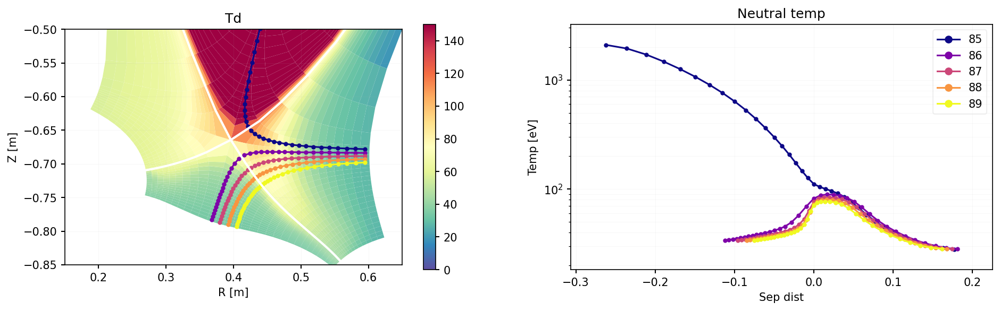

In [156]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

indices = range(85,90)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Td"], marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("log")
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Temp [eV]")
axes[1].set_title("Neutral temp")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

# Radial profile dive

## Neutral temp

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1275055516.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

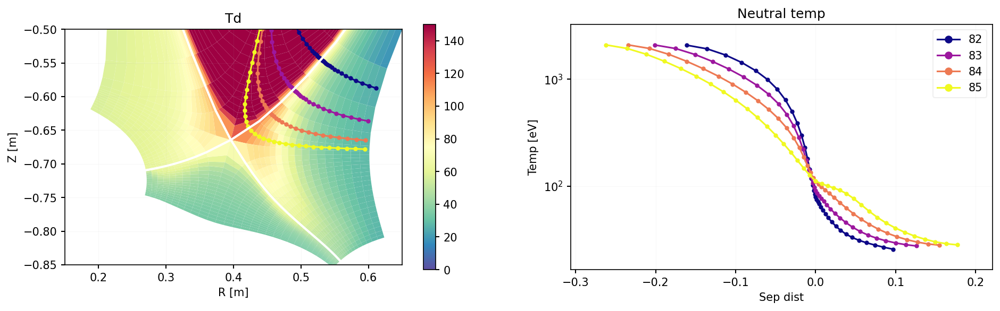

In [188]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

indices = range(82,86)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Td"], marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Temp [eV]")
axes[1].set_title("Neutral temp")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

## Convection

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\157173302.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

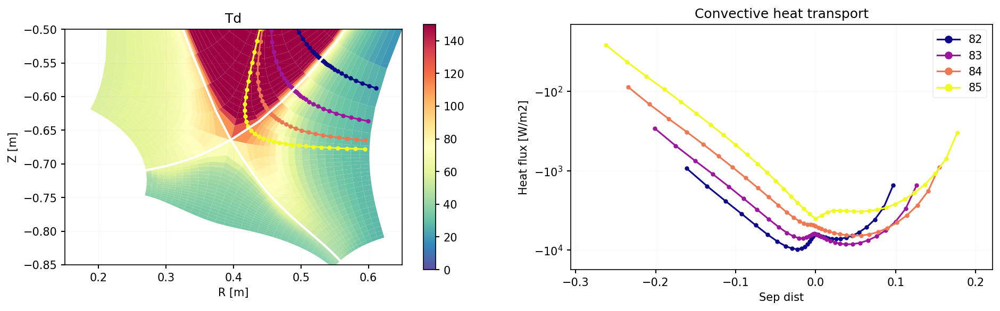

In [191]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

indices = range(82,86)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["hf_perp_conv_L_d"]/(sl["dy"]*sl["dz"]), marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Heat flux [W/m2]")
axes[1].set_title("Convective heat transport")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

## Conduction

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1772823470.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

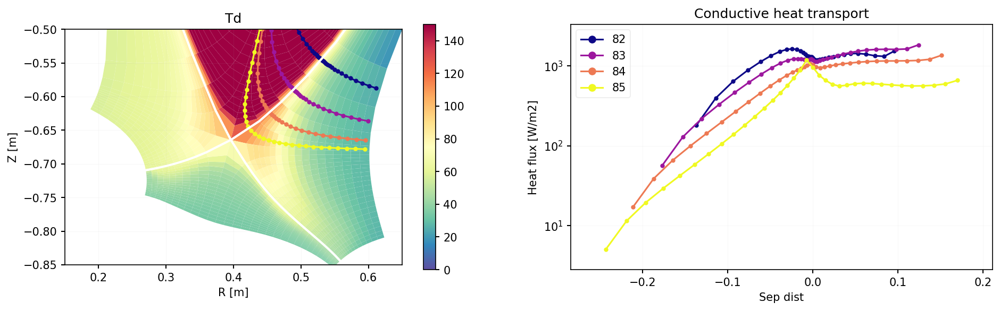

In [193]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

indices = range(82,86)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(3, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["hf_perp_diff_L_d"]/(sl["dy"]*sl["dz"]), marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Heat flux [W/m2]")
axes[1].set_title("Conductive heat transport")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

## Flux summary on 85

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\724047725.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


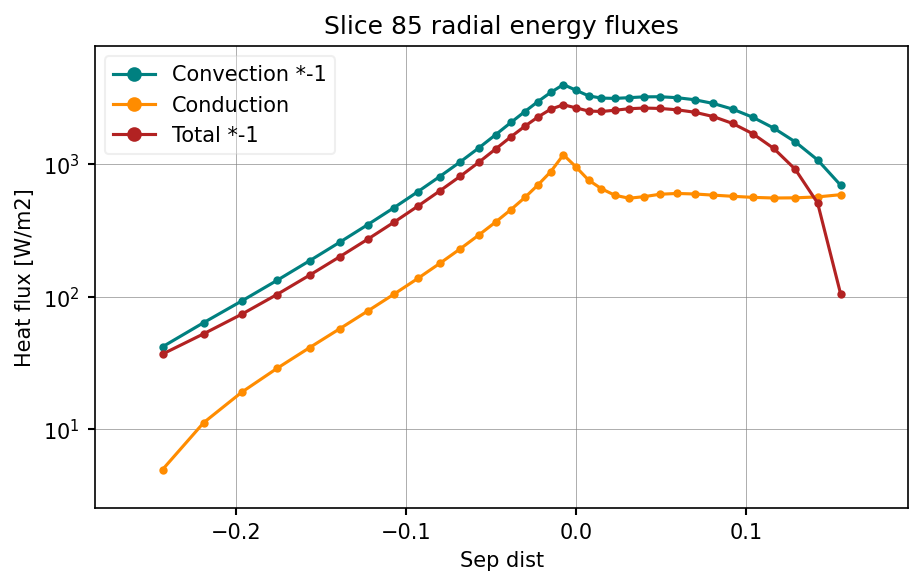

In [212]:
fig, ax = plt.subplots(figsize = (7,4), dpi = 150)

colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

theta_idx = 85
sl = ds.isel(theta = theta_idx, x = slice(3, -3))
dist = np.cumsum(sl["dr"])
dist -= dist[m["ixseps1"]-2]

ax.plot(dist, sl["hf_perp_conv_L_d"]*-1, marker = "o", ms = 3, label = "Convection *-1")
ax.plot(dist, sl["hf_perp_diff_L_d"], marker = "o", ms = 3, label = "Conduction")
ax.plot(dist, sl["hf_perp_tot_L_d"]*-1, marker = "o", ms = 3, label = "Total *-1")

    
ax.legend()
ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("Sep dist")
ax.set_ylabel("Heat flux [W/m2]")
ax.set_title("Slice 85 radial energy fluxes")
ax.grid(alpha=1, c = "grey")


## Limiters on 85

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\229893383.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


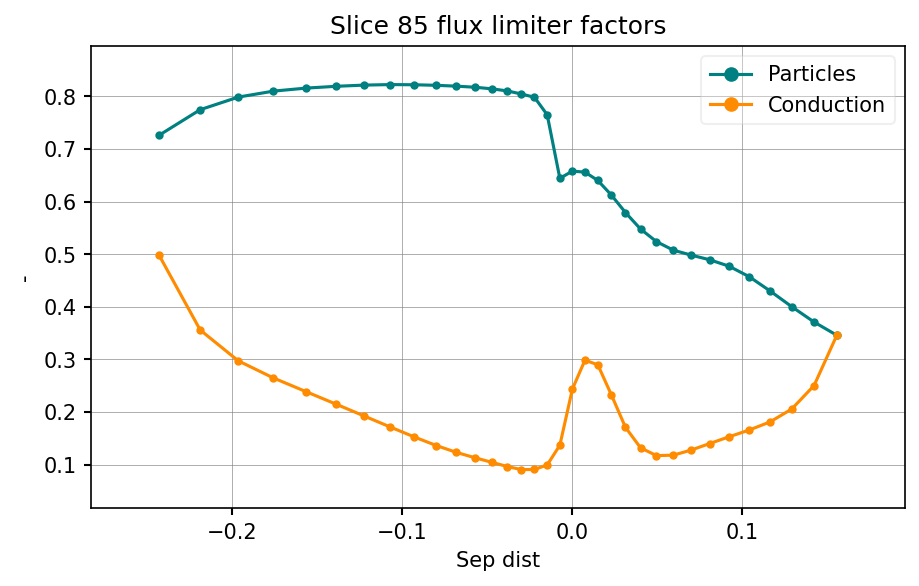

In [221]:
fig, ax = plt.subplots(figsize = (7,4), dpi = 150)

colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

theta_idx = 85
sl = ds.isel(theta = theta_idx, x = slice(3, -3))
dist = np.cumsum(sl["dr"])
dist -= dist[m["ixseps1"]-2]

ax.plot(dist, sl["particle_flux_factor_d"], marker = "o", ms = 3, label = "Particles")
ax.plot(dist, sl["heat_flux_factor_d"], marker = "o", ms = 3, label = "Conduction")

    
ax.legend()
# ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("Sep dist")
ax.set_ylabel("-")
ax.set_title("Slice 85 flux limiter factors")
ax.grid(alpha=1, c = "grey")


## Limited and unlimited fluxes

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\3893002015.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


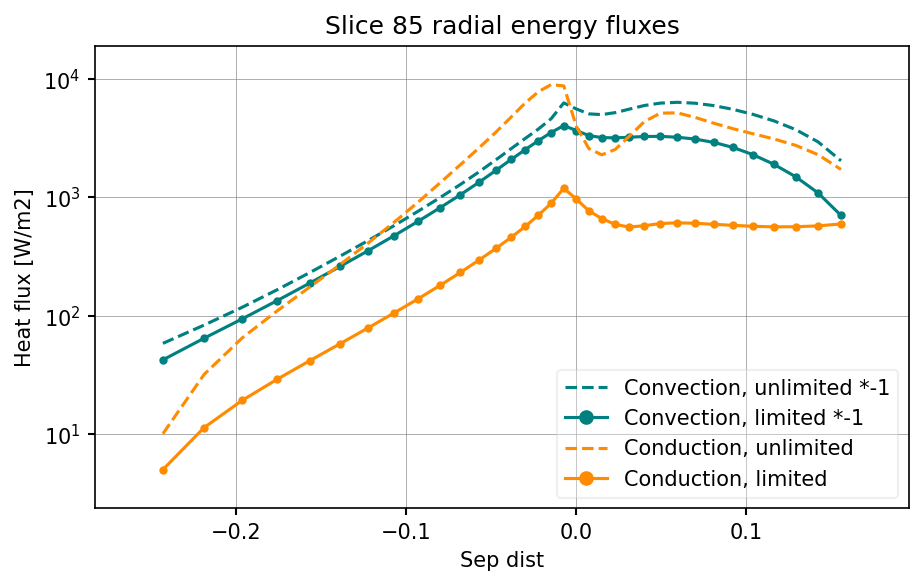

In [234]:
fig, ax = plt.subplots(figsize = (7,4), dpi = 150)

colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

theta_idx = 85
sl = ds.isel(theta = theta_idx, x = slice(3, -3))
dist = np.cumsum(sl["dr"])
dist -= dist[m["ixseps1"]-2]

ax.plot(dist, sl["hf_perp_conv_L_d"]*-1 / (sl["dy"] * sl["dz"] * sl["particle_flux_factor_d"]), ls = "--",label = "Convection, unlimited *-1", c = "teal")
ax.plot(dist, sl["hf_perp_conv_L_d"]*-1 / (sl["dy"] * sl["dz"]), marker = "o", ms = 3,  label = "Convection, limited *-1", c = "teal")

# ax.plot(dist, sl["hf_perp_conv_L_d"]*-1 / sl["particle_flux_factor_d"], marker = "o", ms = 3, label = "Convection *-1")
ax.plot(dist, sl["hf_perp_diff_L_d"] / (sl["dy"] * sl["dz"] * sl["heat_flux_factor_d"]),  ls = "--", label = "Conduction, unlimited", c = "darkorange")
ax.plot(dist, sl["hf_perp_diff_L_d"] / (sl["dy"] * sl["dz"]), label = "Conduction, limited", c = "darkorange", marker = "o", ms = 3, )
# ax.plot(dist, sl["hf_perp_tot_L_d"]*-1, marker = "o", ms = 3, label = "Total *-1")

    
ax.legend()
ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("Sep dist")
ax.set_ylabel("Heat flux [W/m2]")
ax.set_title("Slice 85 radial energy fluxes")
ax.grid(alpha=1, c = "grey")


## Tn on final radial slice

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1418704210.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))


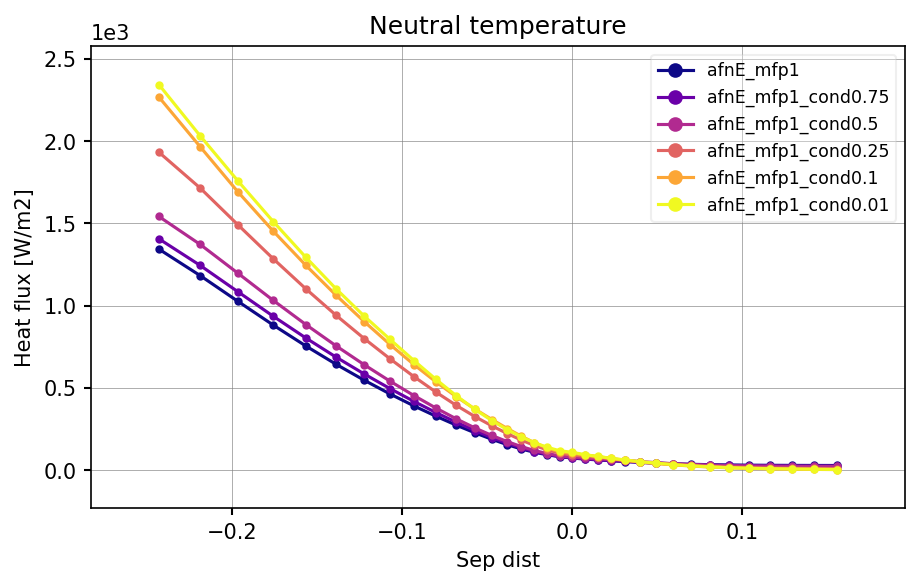

In [247]:
fig, ax = plt.subplots(figsize = (7,4), dpi = 150)

cases = [x for x in casestore.keys() if "notune" not in x]
colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))
theta_idx = 85

for i, case in enumerate(cases):
    ds = casestore[case].ds.isel(t=-1)
    sl = ds.isel(theta = theta_idx, x = slice(3, -3))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]
    ax.plot(dist, sl["Td"], label = case,  marker = "o", ms = 3, color = colors[i])

ax.legend(fontsize="small")
# ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("Sep dist")
ax.set_ylabel("Heat flux [W/m2]")
ax.set_title("Neutral temperature")
ax.grid(alpha=1, c = "grey")


# Transport

In [168]:
ds = reverse_pfr_fluxes(ds)

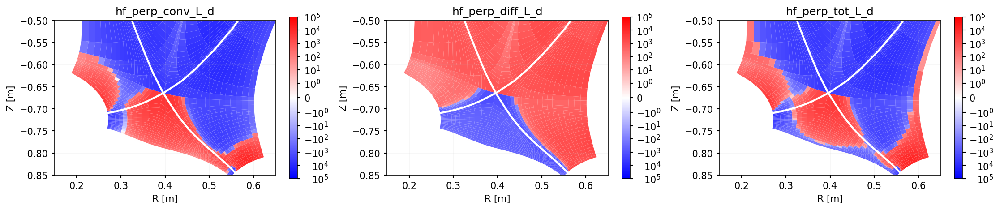

In [169]:
fig, axes = plt.subplots(1,3,figsize=(15,3), dpi = 150)
# ds = casestore["best_notune"].ds.isel(t=-1)

vmin = 10
vmax = 150
common_settings = dict(cmap = "bwr", antialias = True, logscale = True, vmin = -1e5, vmax = 1e5)
ds["hf_perp_conv_L_d"].hermesm.clean_guards().bout.polygon(ax = axes[0], **common_settings)
ds["hf_perp_diff_L_d"].hermesm.clean_guards().bout.polygon(ax = axes[1], **common_settings)
ds["hf_perp_tot_L_d"].hermesm.clean_guards().bout.polygon(ax = axes[2], **common_settings)
# abs(ds["Fdd+_cx"]).bout.polygon(ax = axes[2], vmin = None, vmax = None, logscale = True, **common_settings)
for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    
fig.tight_layout()


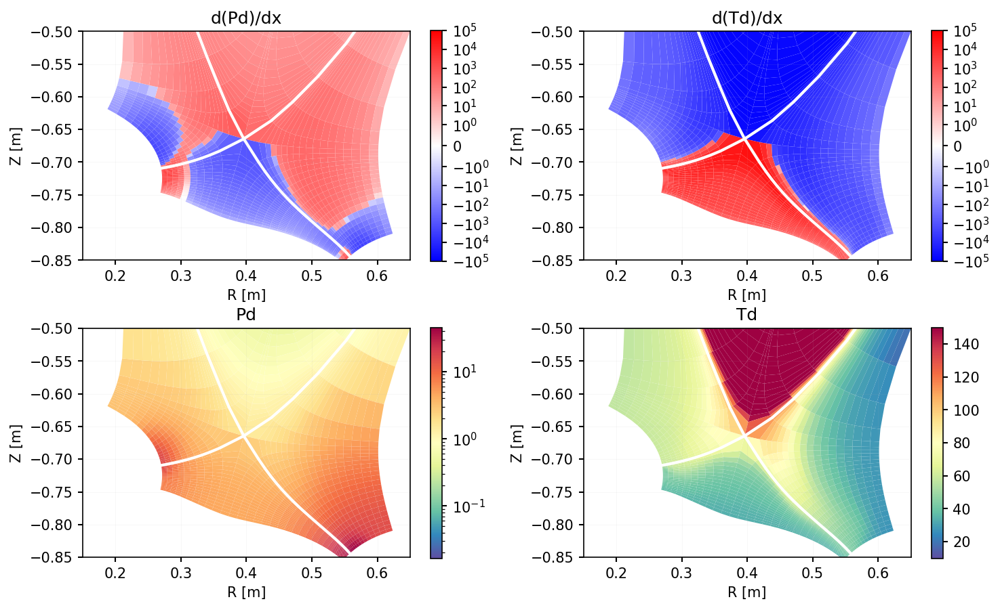

In [163]:
fig, axeses = plt.subplots(2,2,figsize=(10,6), dpi = 150)
ds = casestore["best_notune"].ds.isel(t=-1)

axes= axeses[0,:]
vmin = 10
vmax = 150
common_settings = dict(cmap = "bwr", antialias = True, logscale = True, vmin = -1e5, vmax = 1e5)
ds["Pd"].bout.ddx().hermesm.clean_guards().bout.polygon(ax = axes[0], **common_settings)
ds["Td"].bout.ddx().hermesm.clean_guards().bout.polygon(ax = axes[1], **common_settings)
for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    
axes= axeses[1,:]
vmin = 10
vmax = 150
common_settings = dict(cmap = "Spectral_r", antialias = True)
ds["Pd"].hermesm.clean_guards().bout.polygon(ax = axes[0], **common_settings, logscale = True)
ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[1], **common_settings, vmin = 10, vmax = 150)
for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    
fig.tight_layout()


## Multiple poloidal slices

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\2578968305.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


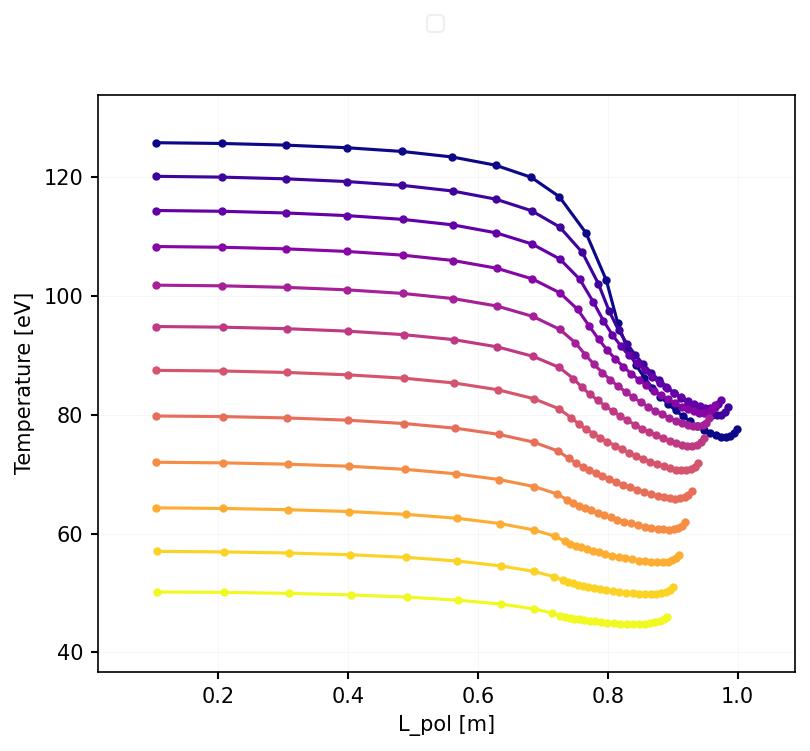

In [103]:
m = ds.metadata

indices = range(m["ixseps1"],m["ixseps1"]+12)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

fig, ax = plt.subplots(dpi = 150)
for i, x_idx in enumerate(indices):
    fl = ds.isel(x = x_idx, theta = slice(76,-2))
    # plot_selection(ds,fl)
    dist = np.cumsum(fl["dl"])
    
    # ax.plot(dist, fl["Td"], marker = "o", color = colors[i], ms = 3)
    ax.plot(dist, fl["Td+"], marker = "o", color = colors[i], ms = 3)

# ax2 = ax.twinx()
# ax2.plot(dist, fl["SPd"], c = "deeppink", label = "SPd")
# ax2.set_yscale("symlog", linthresh = 1e-3)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax2.set_ylabel("Neutral pressure source [Wm-3]")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

# Conductivity scan

## 2D plots

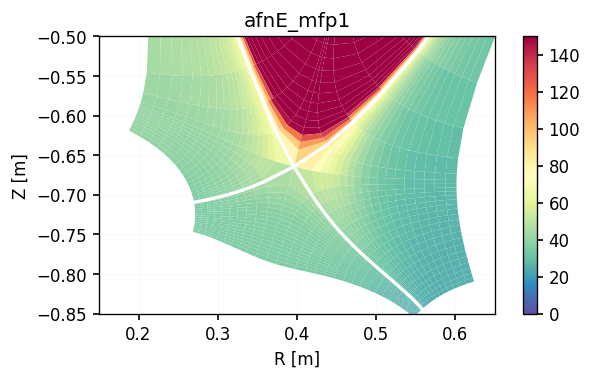

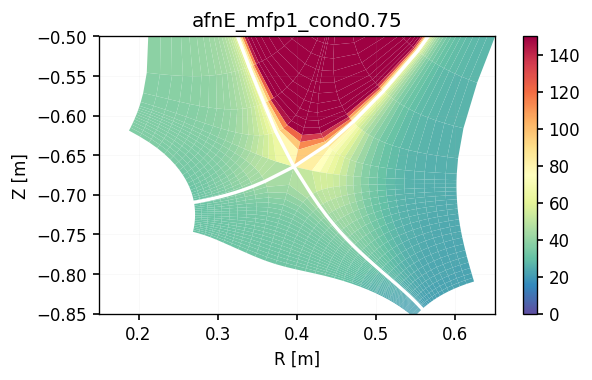

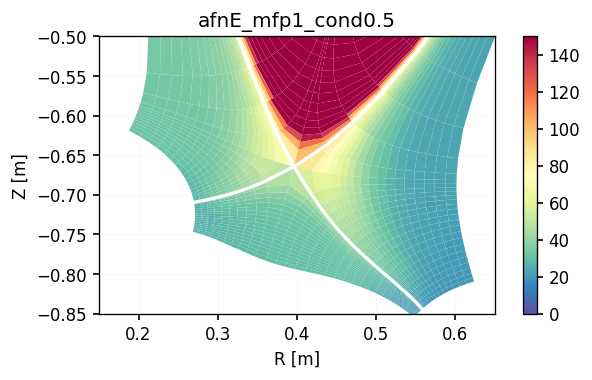

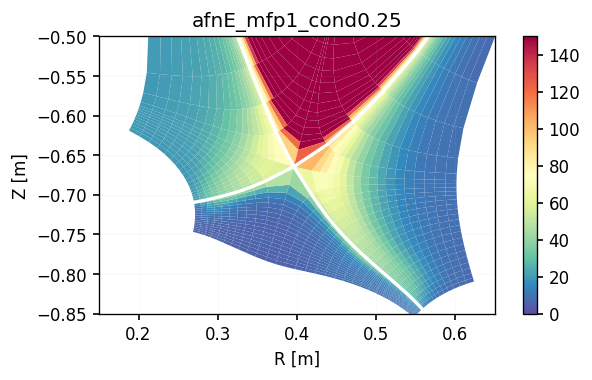

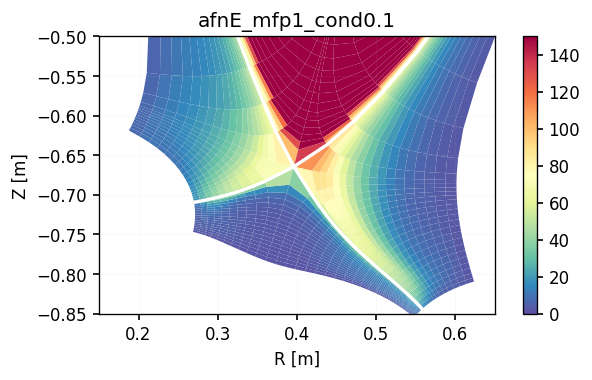

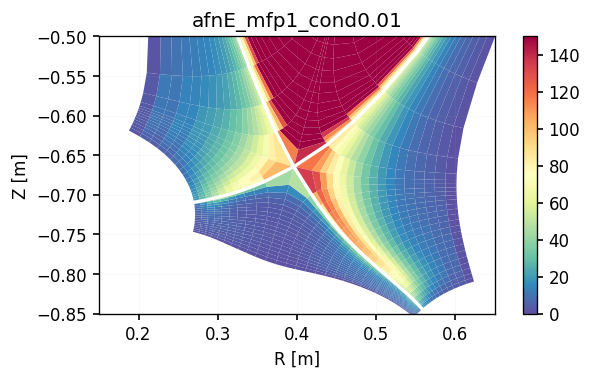

In [ ]:
for case in [x for x in casestore.keys() if "notune" not in x]:
    fig, ax = plt.subplots(figsize = (6,3))
    ds = casestore[case].ds.isel(t=-1)
    ds["Td"].hermesm.clean_guards().bout.polygon(ax, cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.set_title(case)

## Poloidal Tn

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1902401253.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))


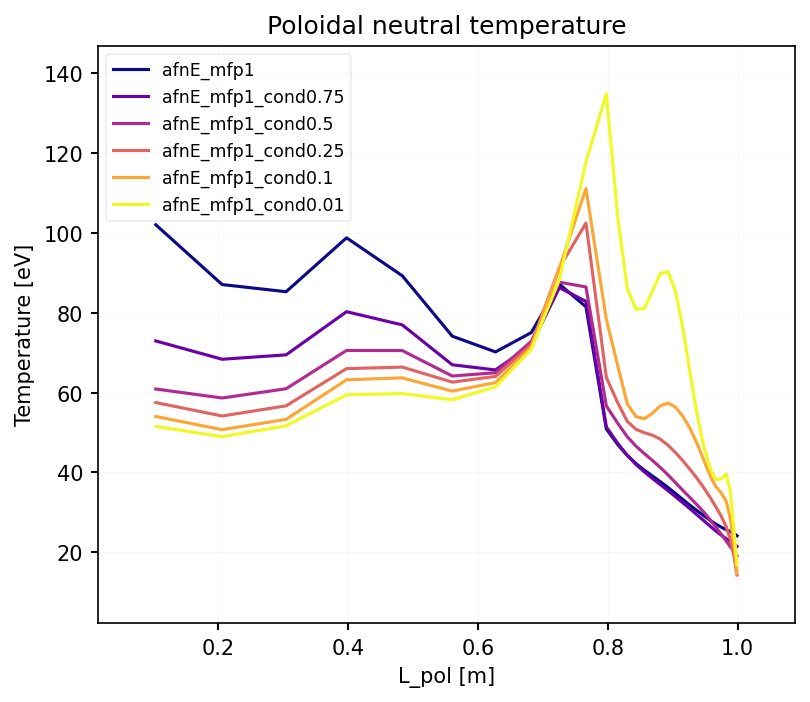

In [ ]:
cases = [x for x in casestore.keys() if "notune" not in x]
colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))
fig, ax = plt.subplots(dpi = 150)

for i, case in enumerate(cases):
    ds = casestore[case].ds.isel(t=-1)
    fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
    dist = np.cumsum(fl["dl"])
    ax.plot(dist, fl["Td"], label = case, color = colors[i])
# ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax.set_title("Poloidal neutral temperature")
ax.legend(fontsize="small")

## Conduction on final radial slice

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\2367423730.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))


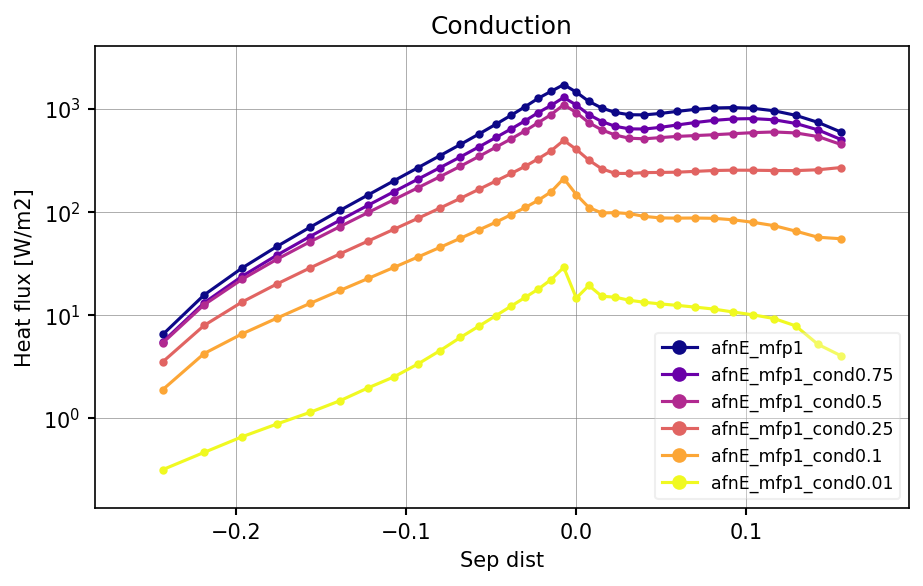

In [ ]:
fig, ax = plt.subplots(figsize = (7,4), dpi = 150)

cases = [x for x in casestore.keys() if "notune" not in x]
colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))
theta_idx = 85

for i, case in enumerate(cases):
    ds = casestore[case].ds.isel(t=-1)
    sl = ds.isel(theta = theta_idx, x = slice(3, -3))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]
    ax.plot(dist, sl["hf_perp_diff_L_d"] / (sl["dy"] * sl["dz"]), label = case,  marker = "o", ms = 3, color = colors[i])

ax.legend(fontsize="small")
ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("Sep dist")
ax.set_ylabel("Heat flux [W/m2]")
ax.set_title("Conduction")
ax.grid(alpha=1, c = "grey")


## Net heat transport on final radial slice

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1097903462.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))


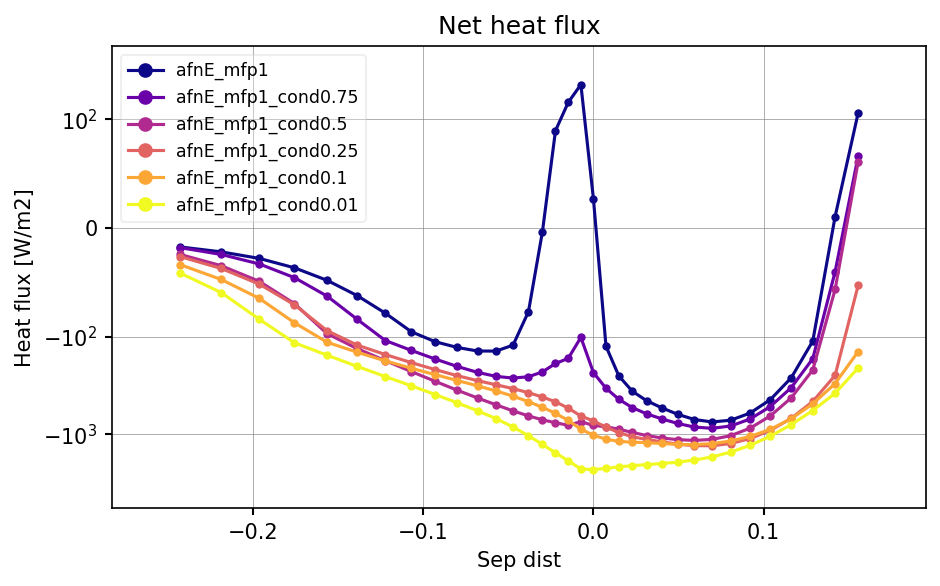

In [ ]:
fig, ax = plt.subplots(figsize = (7,4), dpi = 150)

cases = [x for x in casestore.keys() if "notune" not in x]
colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))
theta_idx = 85

for i, case in enumerate(cases):
    ds = casestore[case].ds.isel(t=-1)
    sl = ds.isel(theta = theta_idx, x = slice(3, -3))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]
    ax.plot(dist, sl["hf_perp_tot_L_d"] / (sl["dy"] * sl["dz"]), label = case,  marker = "o", ms = 3, color = colors[i])

ax.legend(fontsize="small")
ax.set_yscale("symlog", linthresh = 1e2)
ax.set_xlabel("Sep dist")
ax.set_ylabel("Heat flux [W/m2]")
ax.set_title("Net heat flux")
ax.grid(alpha=1, c = "grey")


# Analysis of no conduction case

## Radial convection: is it convective?

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1917176473.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

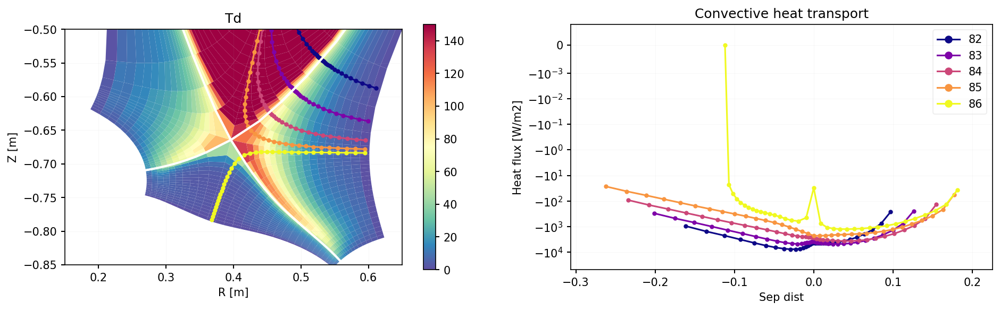

In [322]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)
ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1)
indices = range(82,87)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["hf_perp_conv_L_d"]/(sl["dy"]*sl["dz"]), marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Heat flux [W/m2]")
axes[1].set_title("Convective heat transport")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

## Total fluxes

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\1167507585.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

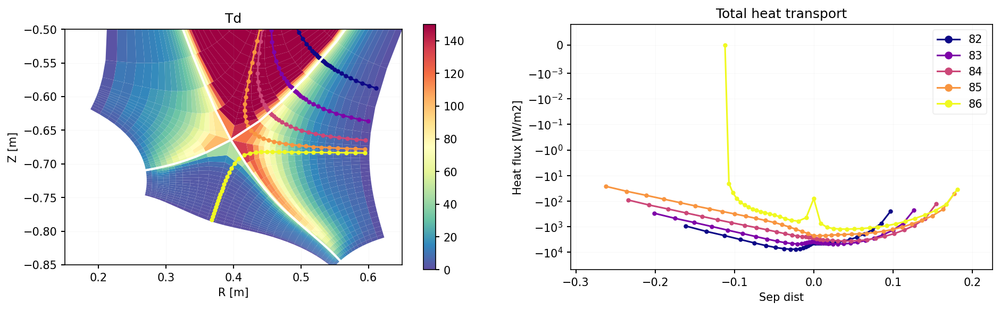

In [282]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)
ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1)
indices = range(82,87)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["hf_perp_tot_L_d"]/(sl["dy"]*sl["dz"]), marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Heat flux [W/m2]")
axes[1].set_title("Total heat transport")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\2319102859.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

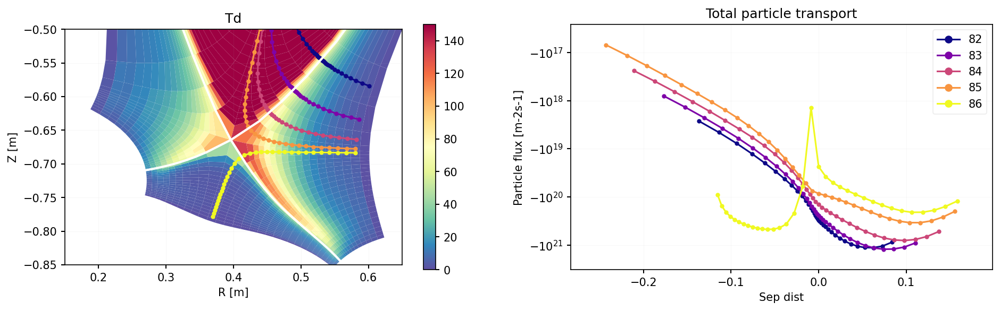

In [327]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)
ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1)
indices = range(82,87)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(3, -3))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["pf_perp_diff_L_d"]/(sl["dy"]*sl["dz"]), marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Particle flux [m-2s-1]")
axes[1].set_title("Total particle transport")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\2399761938.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

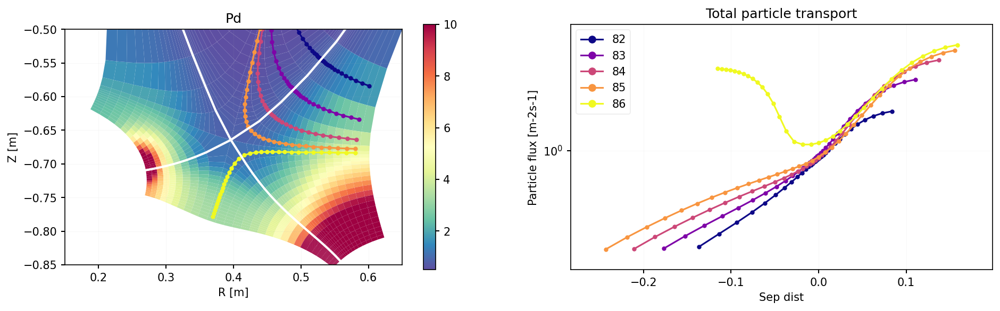

In [330]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)
ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1)
indices = range(82,87)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(3, -3))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Pd"], marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Particle flux [m-2s-1]")
axes[1].set_title("Total particle transport")

ds["Pd"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 10, vmin = 0.5, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

C:\Users\mikek\AppData\Local\Temp\ipykernel_18868\3577599201.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

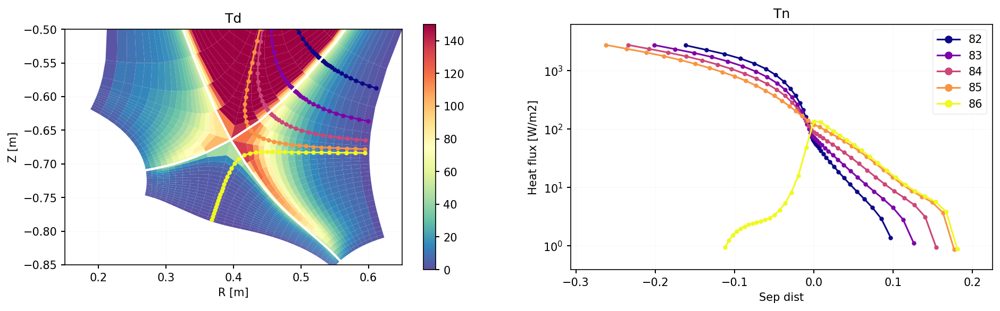

In [324]:
fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)
ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1)
indices = range(82,87)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    dist = np.cumsum(sl["dr"])
    dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Td"], marker = "o", ms = 3, label = theta_idx, color = colors[i])
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Td+"], marker = "o", label = theta_idx, color = colors[i])
    
axes[1].legend()
axes[1].set_yscale("symlog", linthresh = 1e-3)
axes[1].set_xlabel("Sep dist")
axes[1].set_ylabel("Heat flux [W/m2]")
axes[1].set_title("Tn")

ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmax = 150, vmin = 0, antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

## Poloidal temps: is it from ions?

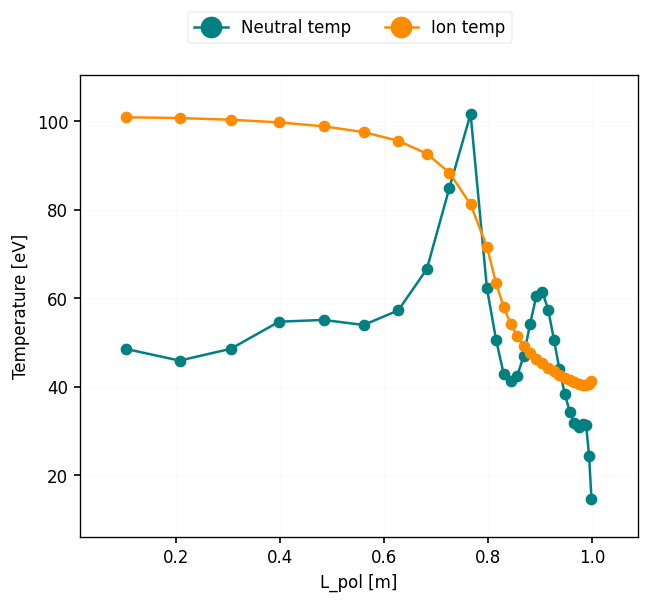

In [26]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 120)
ax.plot(dist, fl["Td"], marker = "o", label = "Neutral temp")
ax.plot(dist, fl["Td+"], marker = "o", label = "Ion temp")

# ax2 = ax.twinx()
# ax2.plot(dist, fl["SPd"], c = "deeppink", label = "SPd")
# ax2.set_yscale("symlog", linthresh = 1e-3)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax2.set_ylabel("Neutral pressure source [Wm-3]")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

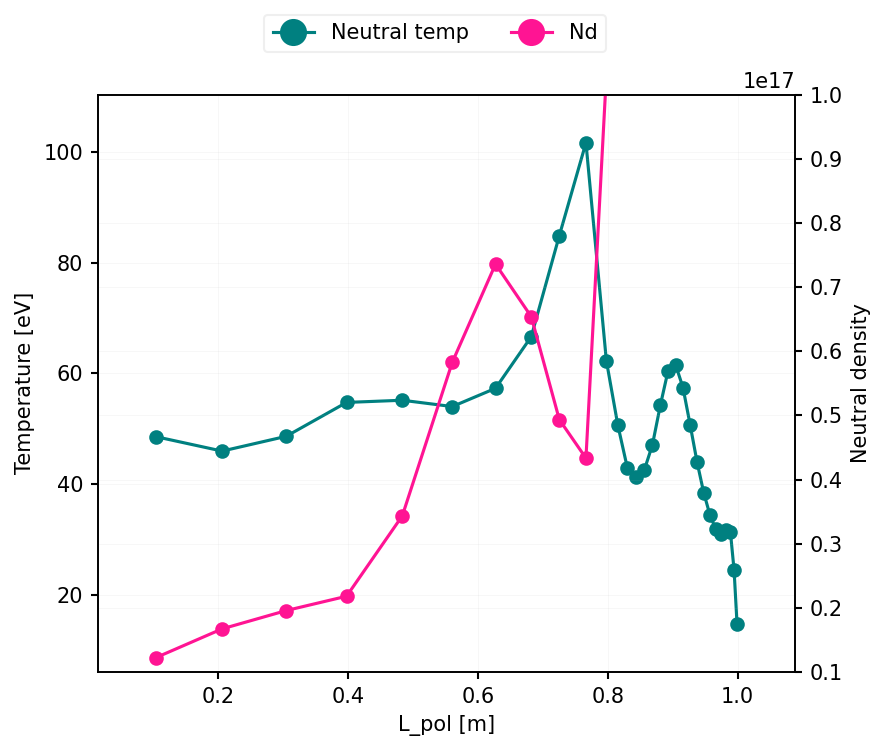

In [31]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, fl["Td"], marker = "o", label = "Neutral temp")
# ax.plot(dist, fl["Nd"], marker = "o", label = "Ion temp")

ax2 = ax.twinx()
ax2.plot(dist, fl["Nd"], c = "deeppink", label = "Nd",marker="o")
# ax2.set_yscale("symlog", linthresh = 1e-3)
ax2.set_ylim(1e16, 1e17)
ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax2.set_ylabel("Neutral density")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

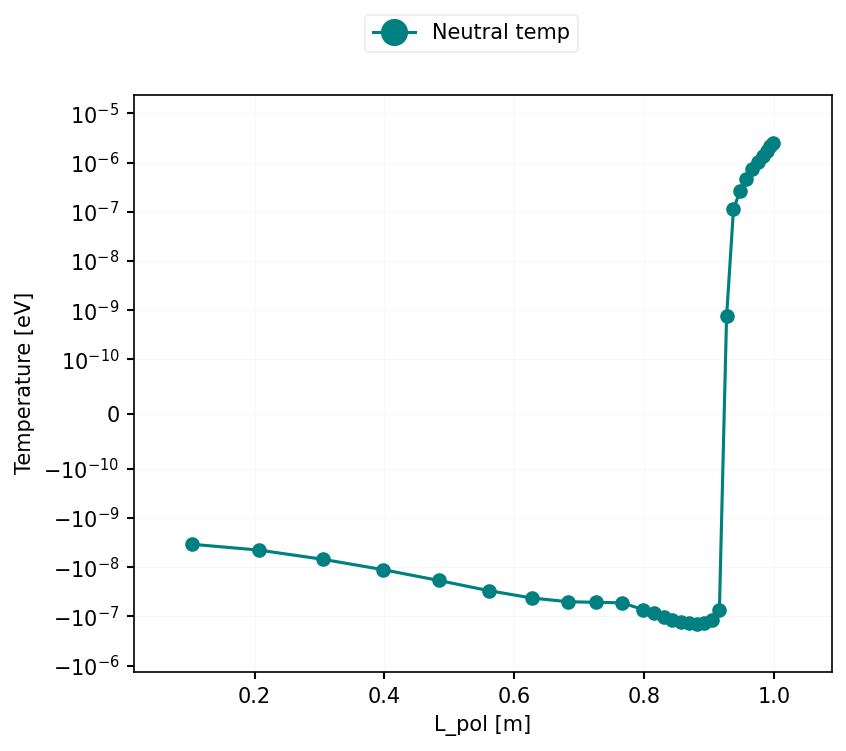

In [36]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, fl["ddt(Pd)"], marker = "o", label = "Neutral temp")
# ax.plot(dist, fl["Nd"], marker = "o", label = "Ion temp")

# ax2 = ax.twinx()
# ax2.plot(dist, fl["Nd"], c = "deeppink", label = "Nd",marker="o")
ax.set_yscale("symlog", linthresh = 1e-10)
# ax2.set_ylim(1e16, 1e17)
ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
# ax2.set_ylabel("Neutral density")

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

## Poloidal velocities

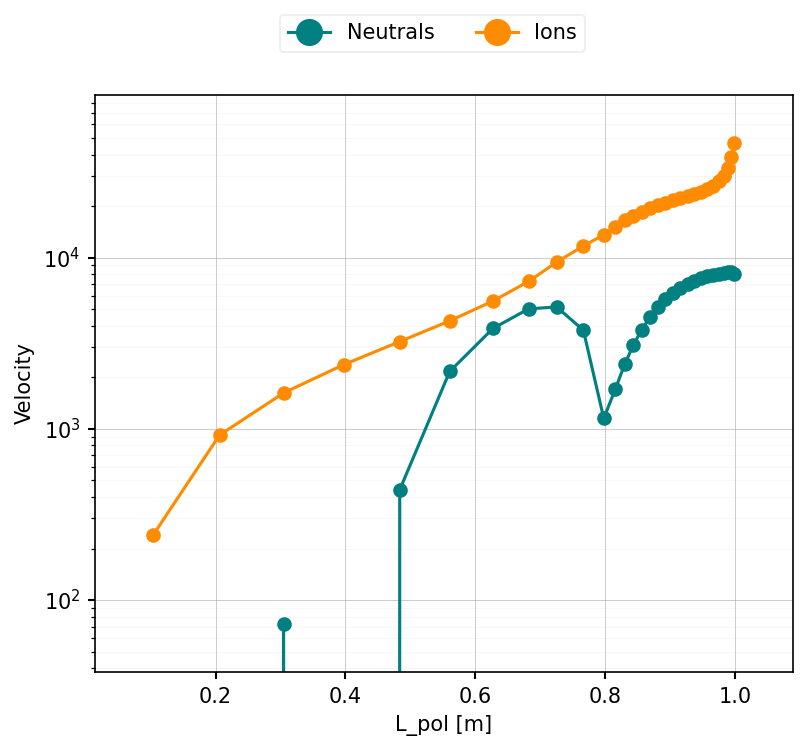

In [9]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, fl["NVd"] / fl["Nd"] / (constants("mass_p")*2), marker = "o", label = "Neutrals")
ax.plot(dist, fl["Vd+"], marker = "o", label = "Ions")

# ax2 = ax.twinx()
# ax2.plot(dist, fl["SPd"], c = "deeppink", label = "SPd")
# ax2.set_yscale("symlog", linthresh = 1e-3)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Velocity")
# ax2.set_ylabel("Neutral pressure source [Wm-3]")
ax.set_yscale("log")
ax.grid(alpha = 1)

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

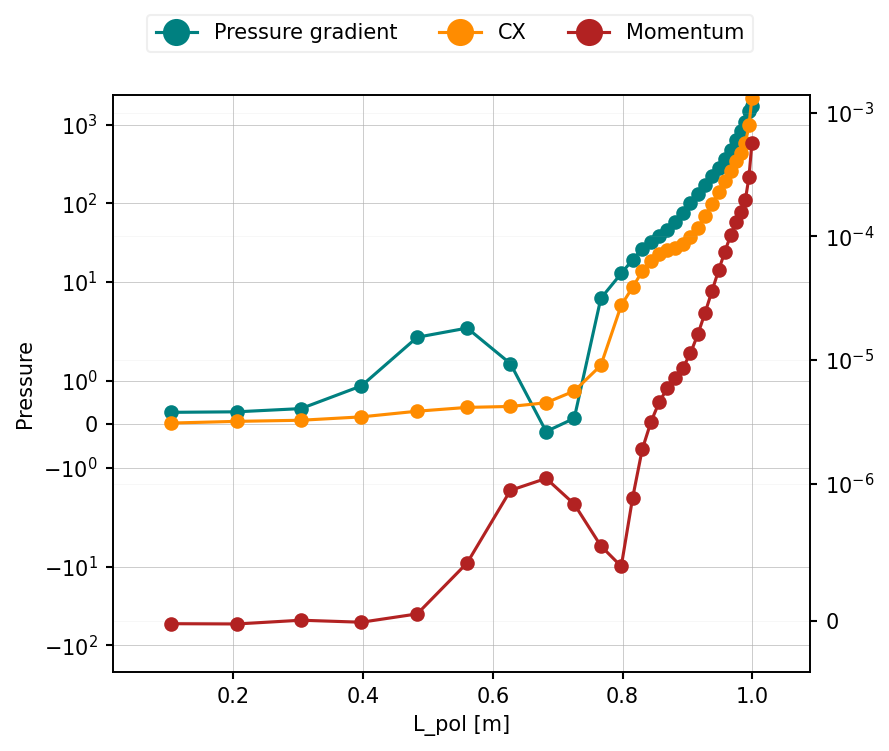

In [24]:
m = ds.metadata
fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
# plot_selection(ds,fl)
dist = np.cumsum(fl["dl"])
fig, ax = plt.subplots(dpi = 150)
ax.plot(dist, np.gradient(fl["Pd"], dist), marker = "o", label = "Pressure gradient")
ax.plot(dist, fl["Fdd+_cx"], marker = "o", label = "CX")
# ax.plot(dist, fl["Vd+"], marker = "o", label = "Ions")

ax2 = ax.twinx()
ax2.plot(dist, fl["NVd"], marker = "o", label = "Momentum", color = "firebrick")
ax2.set_yscale("symlog", linthresh = 1e-6)

ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Pressure")
# ax2.set_ylabel("Neutral pressure source [Wm-3]")

ax.set_yscale("symlog")
ax.grid(alpha = 1)

fig.legend(ncols = 5, loc = "upper center", bbox_to_anchor = (0.5,1.0))

## Neutral pressure source

(0.15, 0.65)

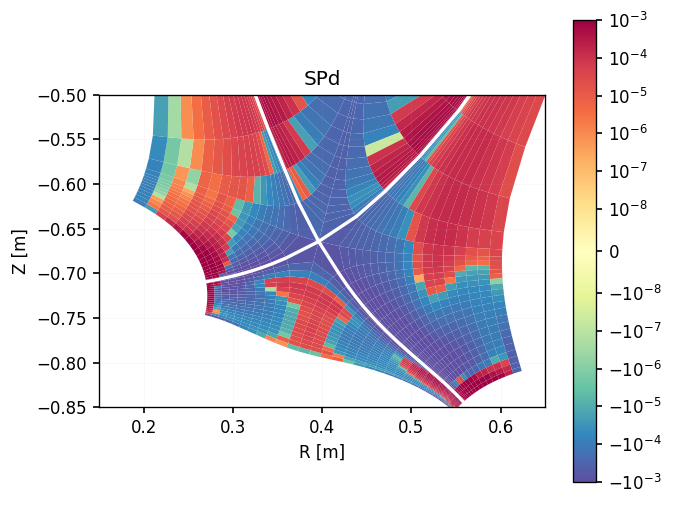

In [279]:
fig, ax = plt.subplots()
ds["SPd"].hermesm.clean_guards().bout.polygon(ax = ax, cmap = "Spectral_r", vmax = 1e-3, vmin = -1e-3, antialias = True, logscale = True)
ax.set_ylim(-0.85, -0.5)
ax.set_xlim(0.15,0.65)

## Neutral density source

(0.15, 0.65)

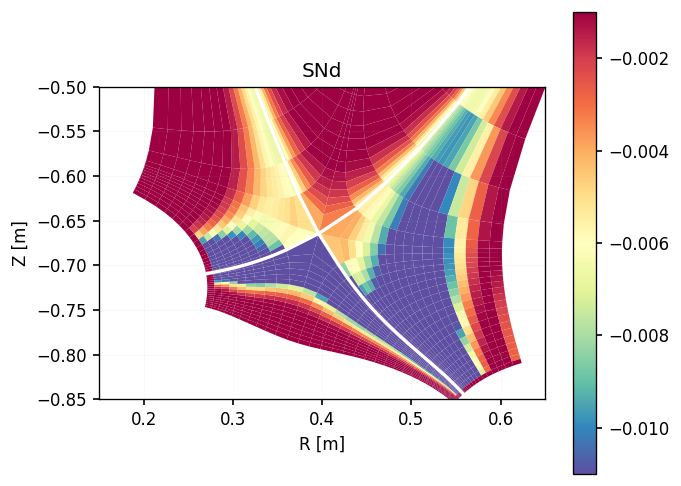

In [309]:
fig, ax = plt.subplots()
ds["SNd"].hermesm.clean_guards().bout.polygon(ax = ax, cmap = "Spectral_r", vmax = -1e-2, vmin = -1e-3, antialias = True, logscale = False)
ax.set_ylim(-0.85, -0.5)
ax.set_xlim(0.15,0.65)

## Neutral temperature, density, pressure

0.5 10


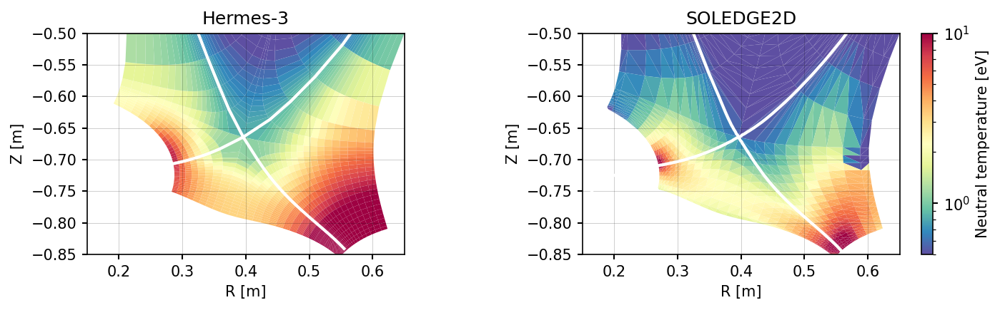

In [318]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (10,3))

vmin = 0.5
vmax = 10
logscale = True

ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Pd"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Hermes-3")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc.plot_2d(param = "Pni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D")
fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

0.5 130


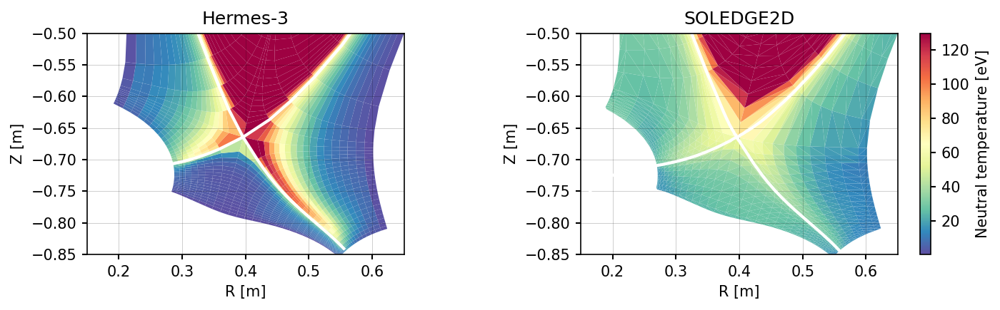

In [320]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (10,3))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Hermes-3")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc.plot_2d(param = "Tni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D")
fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


0.5 130


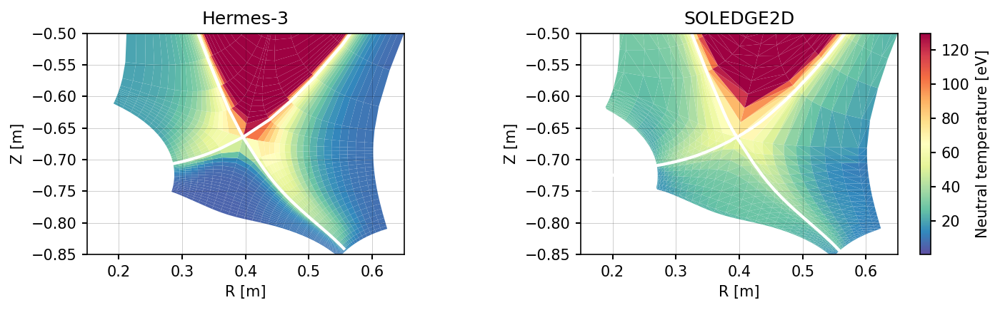

In [321]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (10,3))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.25"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Hermes-3")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc.plot_2d(param = "Tni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D")
fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

(0.15, 0.65)

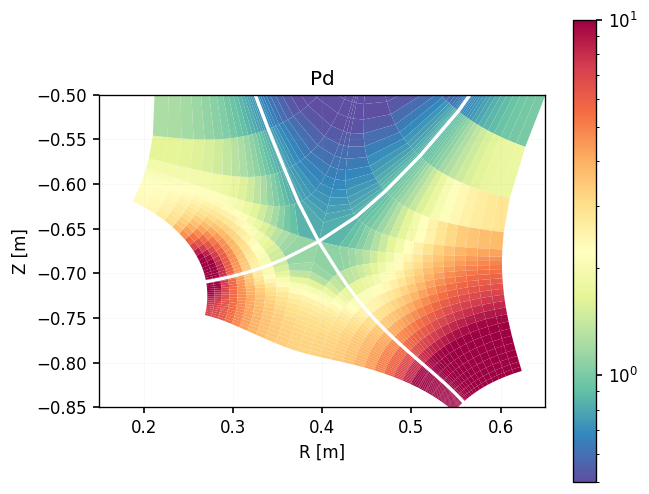

In [310]:
fig, ax = plt.subplots()
ds["Pd"].hermesm.clean_guards().bout.polygon(ax = ax, cmap = "Spectral_r", vmax = 10, vmin = 0.5, antialias = True, logscale = True)
ax.set_ylim(-0.85, -0.5)
ax.set_xlim(0.15,0.65)

# Case with 0.01 conduction alpha and MinMod


C:\Users\mikek\AppData\Local\Temp\ipykernel_23704\3711313910.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))


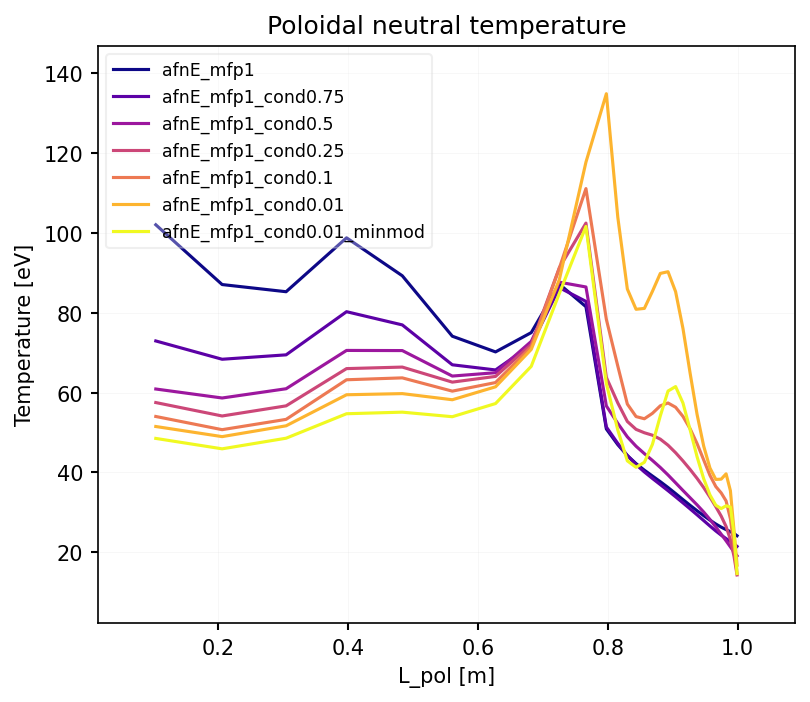

In [7]:
cases = [x for x in casestore.keys() if "notune" not in x]
colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))
fig, ax = plt.subplots(dpi = 150)

for i, case in enumerate(cases):
    ds = casestore[case].ds.isel(t=-1)
    m = ds.metadata
    fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
    dist = np.cumsum(fl["dl"])
    ax.plot(dist, fl["Td"], label = case, color = colors[i])
# ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax.set_title("Poloidal neutral temperature")
ax.legend(fontsize="small")

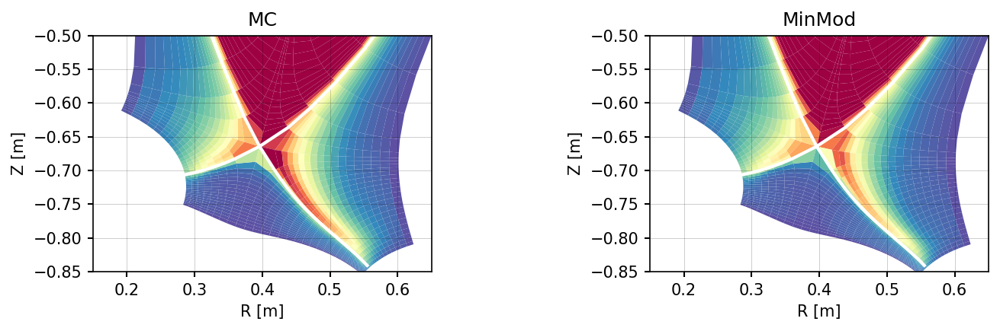

In [71]:



fig, axes = plt.subplots(1,2, dpi = 150, figsize = (10,3))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("MC")

ds = casestore["afnE_mfp1_cond0.01_minmod"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[1].set_title("MinMod")

# slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])
# slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
# slc.plot_2d(param = "Tni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
# axes[1].set_title("SOLEDGE2D")
# fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

# MinMod case with SPd decomposition

In [6]:
print("done")

done


## Td, Pd, Nd

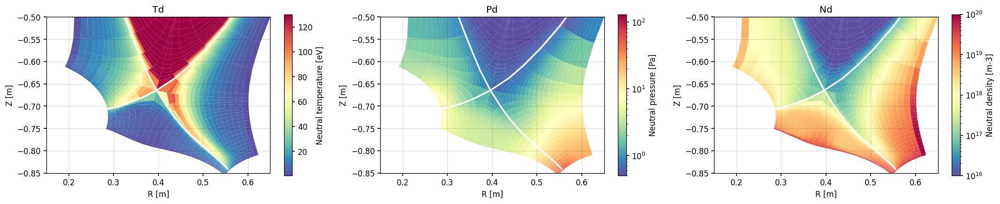

In [70]:
fig, axes = plt.subplots(1,3, dpi = 120, figsize = (18,3.5))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1,  theta=slice(2,-2))

data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = True, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Td")

data = ds["Pd"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = True, antialias = True, add_colorbar = True, colorbar_label = "Neutral pressure [Pa]")
axes[1].set_title("Pd")

data = ds["Nd"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[2], cmap = "Spectral_r", vmin = 1e16, vmax = 1e20, logscale = True, antialias = True, add_colorbar = True, colorbar_label = "Neutral density [m-3]")
axes[2].set_title("Nd")


for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

## Same but with total energy

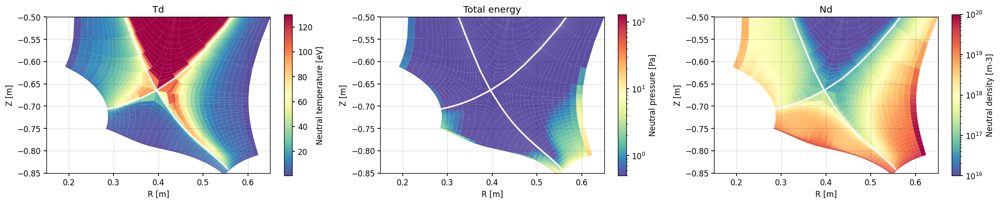

In [12]:
fig, axes = plt.subplots(1,3, dpi = 120, figsize = (18,3.5))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1,  theta=slice(2,-2))

data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = True, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Td")

Vd = ds["NVd"] / ds["Nd"] / (constants("mass_p")*2)
data =  ds["Nd"]*constants("mass_p")*2 * Vd**2
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = True, antialias = True, add_colorbar = True, colorbar_label = "Neutral pressure [Pa]")
axes[1].set_title("Total energy")

data = ds["Nd"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[2], cmap = "Spectral_r", vmin = 1e16, vmax = 1e20, logscale = True, antialias = True, add_colorbar = True, colorbar_label = "Neutral density [m-3]")
axes[2].set_title("Nd")


for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

## All Pd components

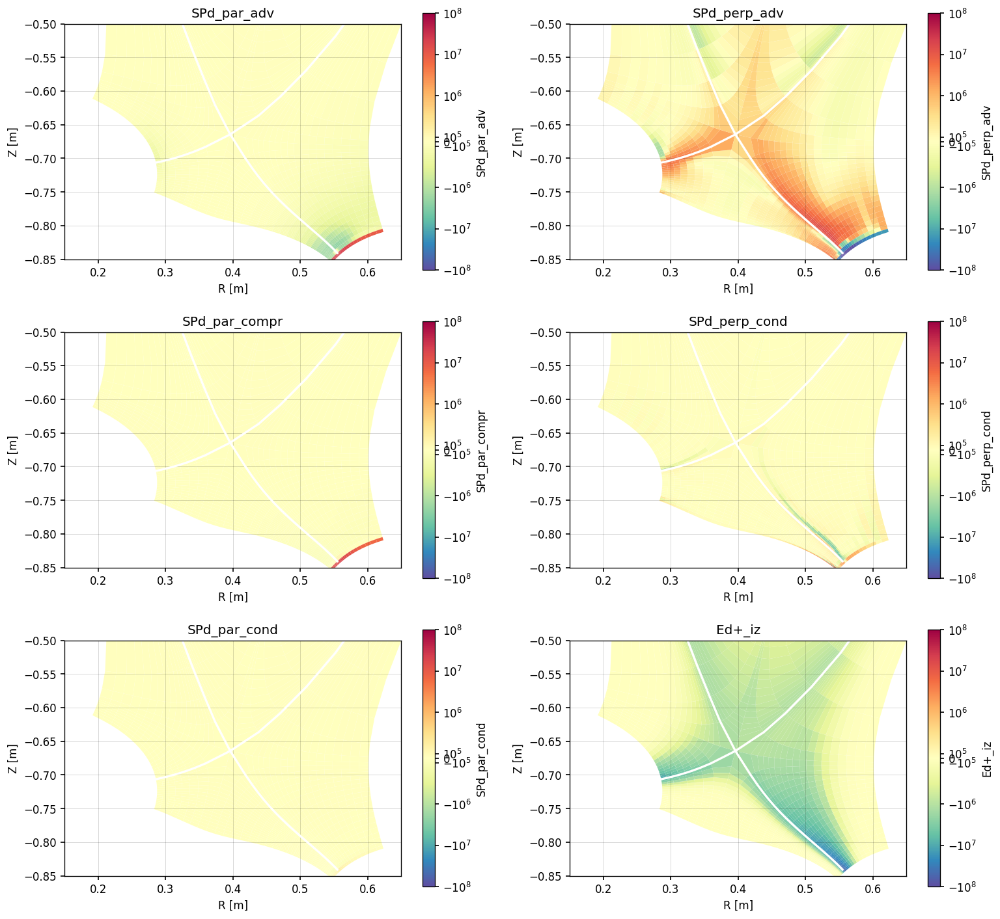

In [78]:
fig, axes = plt.subplots(3,2, dpi = 120, figsize = (13,12))



ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1,  theta=slice(2,-2))

def plot_term(param, ax):
    
    vmin = -1e8
    vmax = 1e8
    logscale = True
    
    norm = create_norm(logscale, None, vmin, vmax, linthresh = 1e6)

    data = ds[param]
    if "SPd" in param: data *= data.attrs["conversion"]
    if "iz" in param: data *= -1
    data.hermesm.clean_guards().hermesm.polygon(ax = ax, cmap = "Spectral_r", norm = norm, antialias = True, add_colorbar = True, colorbar_label = param)
    ax.set_title(param)
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")

"SPd_par_adv", "SPd_par_compr", "SPd_par_cond", "SPd_perp_adv", "SPd_perp_cond", "Ed+_iz", "Edd+_cx"

plot_term("SPd_par_adv", axes[0,0])
plot_term("SPd_par_compr", axes[1,0])
plot_term("SPd_par_cond", axes[2,0])
plot_term("SPd_perp_adv", axes[0,1])
plot_term("SPd_perp_cond", axes[1,1])
# plot_term("Edd+_cx", axes[2,1])
plot_term("Ed+_iz", axes[2,1])

fig.tight_layout()
fig.subplots_adjust(wspace = 0.2)

## Pd components with only critical terms plus Tn/Ti and ratio

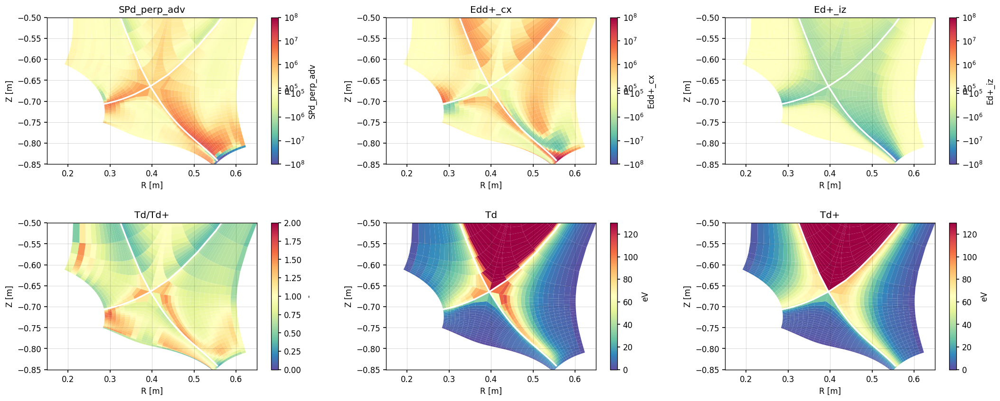

In [96]:
fig, axes = plt.subplots(2,3, dpi = 120, figsize = (18,7))



ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1,  theta=slice(2,-2))

def plot_term(param, ax):
    
    vmin = -1e8
    vmax = 1e8
    logscale = True
    
    norm = create_norm(logscale, None, vmin, vmax, linthresh = 1e6)

    data = ds[param]
    if "SPd" in param: data *= data.attrs["conversion"]
    if "iz" in param: data *= -1
    data.hermesm.clean_guards().hermesm.polygon(ax = ax, cmap = "Spectral_r", norm = norm, antialias = True, add_colorbar = True, colorbar_label = param)
    ax.set_title(param)
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
    ax.set_title(param)

"SPd_par_adv", "SPd_par_compr", "SPd_par_cond", "SPd_perp_adv", "SPd_perp_cond", "Ed+_iz", "Edd+_cx"

plot_term("SPd_perp_adv", axes[0,0])
plot_term("Edd+_cx", axes[0,1])
plot_term("Ed+_iz", axes[0,2])

data = ds["Td"] / ds["Td+"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1,0], cmap = "Spectral_r", vmin = 0, vmax = 2, logscale = False, antialias = True, add_colorbar = True, colorbar_label = "-")
axes[1,0].set_title("Td/Td+")

data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1,1], cmap = "Spectral_r", vmin = 0, vmax = 130, logscale = False, antialias = True, add_colorbar = True, colorbar_label = "eV")
axes[1,1].set_title("Td")

data = ds["Td+"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1,2], cmap = "Spectral_r", vmin = 0, vmax = 130, logscale = False, antialias = True, add_colorbar = True, colorbar_label = "eV")
axes[1,2].set_title("Td+")


for axes in [axes[0,:], axes[1,:]]:
    for ax in axes:

        ax.set_ylim(-0.85, -0.5)
        ax.set_xlim(0.15,0.65)
        ax.grid(alpha = 0.3, c = "k")
        ax.set_xlabel("R [m]")
        ax.set_ylabel("Z [m]")

fig.tight_layout()
fig.subplots_adjust(hspace = 0.4)

## Full poloidal balance
- Lack of balance? Missing heating term?
- Why is perp advection so high? Surely it should be cooling not heating?

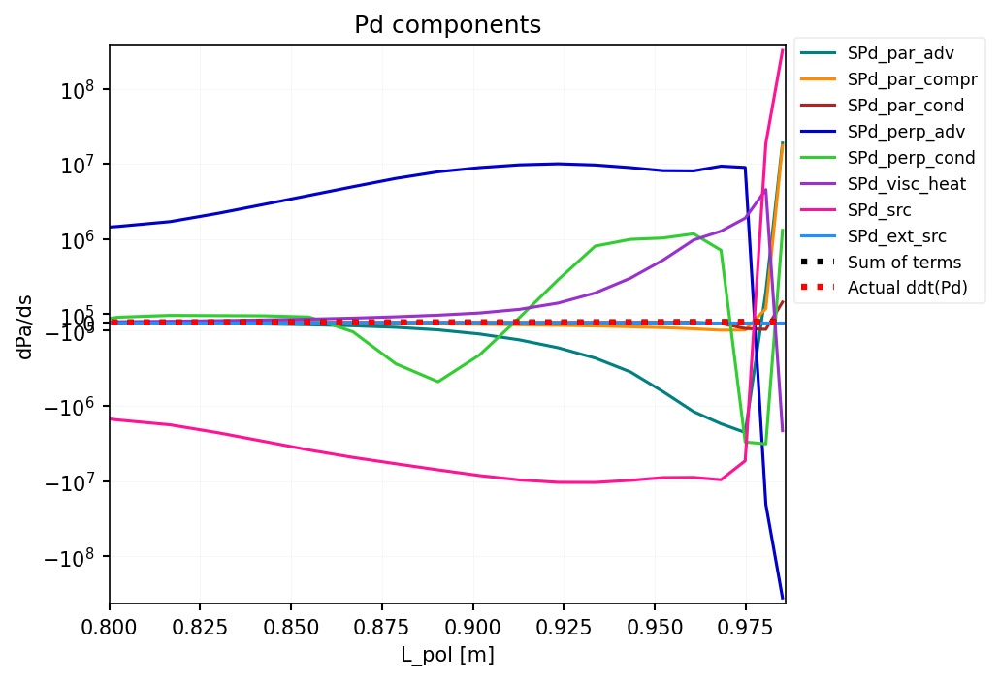

In [26]:
ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1)


fig, ax = plt.subplots(dpi = 150)


m = ds.metadata
fl = ds.isel(x = m["ixseps1"]+1, theta = slice(76,-2))
dist = np.cumsum(fl["dl"])
# ax.plot(dist, fl["Td"], label = "Td")
list_params = ["SPd_par_adv", 
               "SPd_par_compr", 
               "SPd_par_cond", 
               "SPd_perp_adv",
               "SPd_perp_cond", 
               "SPd_visc_heat", 
               "SPd_src", 
               "SPd_ext_src"]

total = 0
for param in list_params:
    if "SPd" in param:
        data = fl[param] * fl[param].attrs["conversion"]
    elif "iz" in param:
        data= fl[param] * -1
    else:
        data = fl[param]
        
    if "visc" in param:
        data *= -1
        
    ax.plot(dist, data, label = param)
    
    total += data
    
    # Convert to pressureb
    if not ("SPd" in param):
        data /= 1.5
    

ax.plot(dist, total, label = "Sum of terms", lw = 3, c = "k", ls = ":")
ax.plot(dist, fl["ddt(Pd)"]*fl["ddt(Pd)"].attrs["conversion"], label = "Actual ddt(Pd)", lw = 3, c = "r", ls = ":")

ax.set_xlim(0.8,0.986)
# ax.set_xscale("symlog", linthresh = 0.1)
ax.set_yscale("symlog", linthresh = 1e6)
ax.set_xlabel("L_pol [m]")
ax.set_ylabel("dPa/ds")
ax.set_title("Pd components")
fig.legend(fontsize="small", loc = "upper left", bbox_to_anchor=(0.9,0.9))

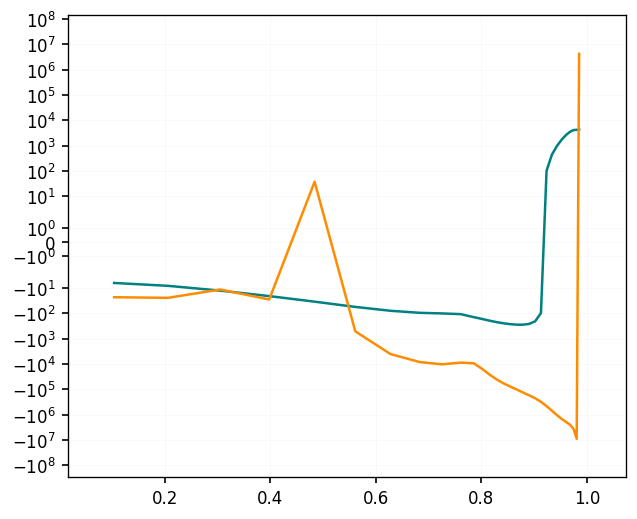

In [24]:
fig, ax = plt.subplots()
ax.plot(dist, fl["ddt(Pd)"]*fl["ddt(Pd)"].attrs["conversion"])
ax.plot(dist, total)
# fl["ddt(Pd)"].plot(ax = ax)
# fl[""]
ax.set_yscale("symlog")

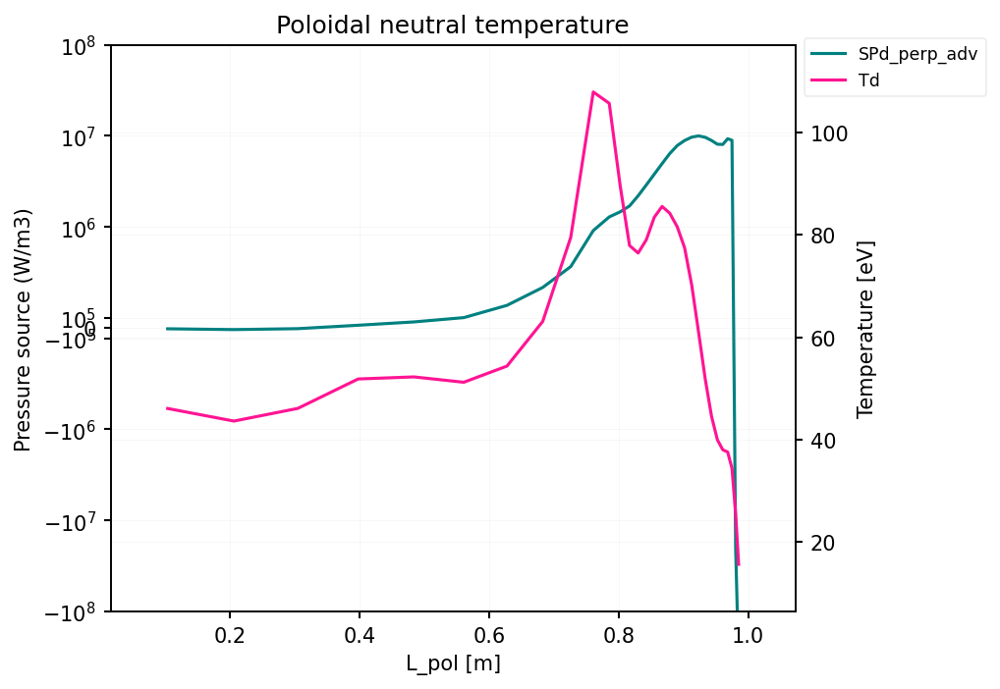

In [146]:
ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1)


fig, ax = plt.subplots(dpi = 150)


m = ds.metadata
fl = ds.isel(x = m["ixseps1"]+1, theta = slice(76,-2))
dist = np.cumsum(fl["dl"])
# ax.plot(dist, fl["Td"], label = "Td")

for param in ["SPd_perp_adv"]:
    if "SPd" in param:
        data = fl[param] * fl[param].attrs["conversion"]
    else:
        data = fl[param]
        
    ax.plot(dist, data, label = param)
    
ax.set_ylim(-1e8,1e8)
ax2 = ax.twinx()
ax2.plot(dist, fl["Td"], label = "Td", c = "deeppink")
ax.set_yscale("symlog", linthresh = 1e6)
ax.set_xlabel("L_pol [m]")
ax2.set_ylabel("Temperature [eV]")
ax.set_ylabel("Pressure source (W/m3)")
ax.set_title("Poloidal neutral temperature")
fig.legend(fontsize="small", loc = "upper left", bbox_to_anchor=(0.9,0.9))

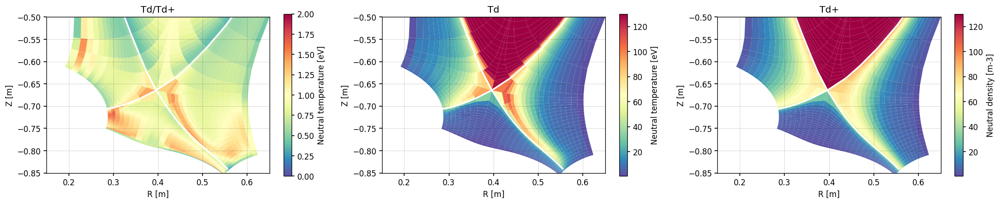

In [132]:
fig, axes = plt.subplots(1,3, dpi = 120, figsize = (18,3.5))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1,  theta=slice(2,-2))

data = ds["Td"] / ds["Td+"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = 0, vmax = 2, logscale = False, antialias = True, add_colorbar = True, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Td/Td+")

data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = True, colorbar_label = "Neutral temperature [eV]")
axes[1].set_title("Td")

data = ds["Td+"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[2], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = True, colorbar_label = "Neutral density [m-3]")
axes[2].set_title("Td+")


for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

## Perp advection breakdown

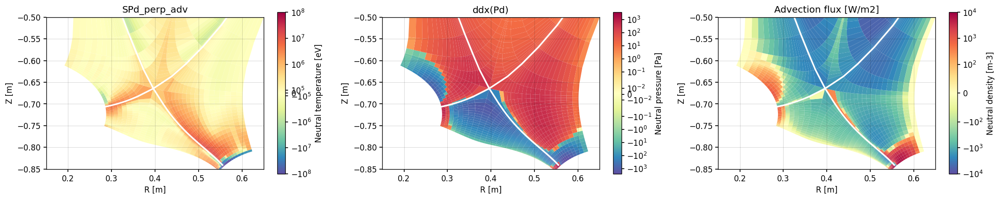

In [131]:
fig, axes = plt.subplots(1,3, dpi = 120, figsize = (18,3.5))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01_minmod_diagnosePd"].ds.isel(t=-1,  theta=slice(2,-2))

param = "SPd_perp_adv"
data = ds[param]
if "SPd" in param: data *= data.attrs["conversion"]
if "iz" in param: data *= -1
axes[0].set_title(param)
norm = create_norm(True, None, -1e8, 1e8, linthresh = 1e6)
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", norm = norm, antialias = True, add_colorbar = True, colorbar_label = "Neutral temperature [eV]")

data = ds["Pd"].bout.ddx()
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = None, vmax = None, logscale = True, antialias = True, add_colorbar = True, colorbar_label = "Neutral pressure [Pa]")
axes[1].set_title("ddx(Pd)")

data = ds["hf_perp_conv_R_d"] / (ds["dy"]*ds["dz"])
norm = create_norm(True, None, -1e4, 1e4, linthresh = 1e2)
data.hermesm.clean_guards().hermesm.polygon(ax = axes[2], cmap = "Spectral_r", norm = norm, antialias = True, add_colorbar = True, colorbar_label = "Neutral density [m-3]")
axes[2].set_title("Advection flux [W/m2]")


for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

# Case with no perpendicular compression term factor
- This needs tuning, it's at 2.5e19 but ARCHER credits ran out
- Simply took out 5/3

In [6]:
casestore.keys()

dict_keys(['best_notune', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.01_minmod_diagnosePd', 'afnE_mfp1_cond0.1', 'afnE_mfp1_cond0.01', 'afnE_mfp1_cond0.01_minmod', 'afnE_minmod_no_perp_compr'])

C:\Users\mikek\AppData\Local\Temp\ipykernel_26668\2930603882.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))


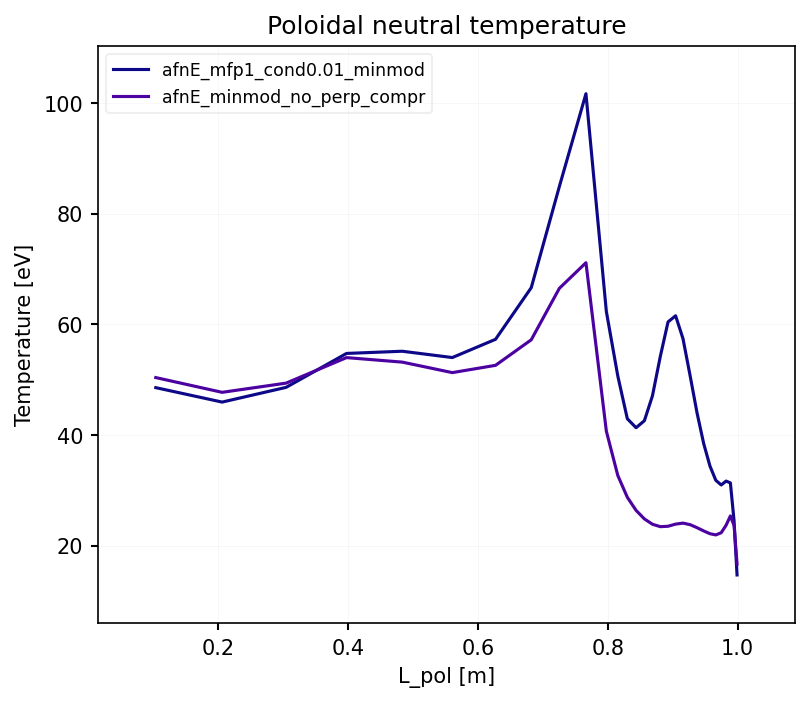

In [8]:
cases = [x for x in casestore.keys() if "notune" not in x]
colors = mpl.cm.get_cmap("plasma", len(cases))(range(len(cases)))
fig, ax = plt.subplots(dpi = 150)

for i, case in enumerate(["afnE_mfp1_cond0.01_minmod", "afnE_minmod_no_perp_compr"]):
    ds = casestore[case].ds.isel(t=-1)
    m = ds.metadata
    fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
    dist = np.cumsum(fl["dl"])
    ax.plot(dist, fl["Td"], label = case, color = colors[i])
# ax.set_yscale("symlog", linthresh = 1e-3)
ax.set_xlabel("L_pol [m]")
ax.set_ylabel("Temperature [eV]")
ax.set_title("Poloidal neutral temperature")
ax.legend(fontsize="small")

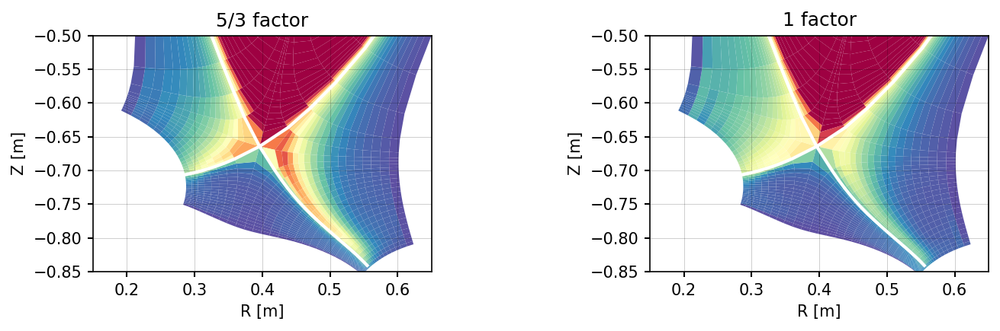

In [10]:



fig, axes = plt.subplots(1,2, dpi = 150, figsize = (10,3))

vmin = 0.5
vmax = 130
logscale = False

ds = casestore["afnE_mfp1_cond0.01_minmod"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("5/3 factor")

ds = casestore["afnE_minmod_no_perp_compr"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[1].set_title("1 factor")

# slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])
# slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
# slc.plot_2d(param = "Tni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
# axes[1].set_title("SOLEDGE2D")
# fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.set_ylim(-0.85, -0.5)
    ax.set_xlim(0.15,0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()